# Work on spectral classification

## Setup

Imports

In [124]:
import os
import re
import gc
import sys
import glob
import yaml
import math
import numpy as np
import pandas as pd
from tqdm import tqdm
from time import time, sleep
import aicspylibczi as aplc
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
from collections import defaultdict
# from scipy.cluster import hierarchy
from sklearn.neighbors import NearestNeighbors
import sklearn.cluster as clst
import hdbscan
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# from skimage.feature import peak_local_max
# from matplotlib_scalebar.scalebar import ScaleBar
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import squareform, pdist, cdist
# from skimage.segmentation import watershed, relabel_sequential
# from skimage.measure import label, regionprops_table, regionprops



Get workdir

In [2]:
cluster = ""
workdir = "/workdir/bmg224/harvard_dental/manuscript/code"
os.chdir(cluster + workdir)


In [3]:
os.getcwd()

'/local/workdir/bmg224/harvard_dental/manuscript/code'

In [183]:
%load_ext autoreload
%autoreload 2
functions_path = '/workdir/bmg224/manuscripts/mgefish/code/functions'

sys.path.append(cluster + functions_path)

import fn_general_use as fgu
import image_plots as ip
import segmentation_func as sf
import fn_hiprfish_classifier as fhc
import fn_spectral_images as fsi
# import fn_analysis_plots as apl

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [185]:
config_fn = "config.yaml"  # relative path to config file from workdir

with open(config_fn, "r") as f:
    config = yaml.safe_load(f)

In [162]:
sciname_list = [
    'Pasteurellaceae',
    'Corynebacterium',
    'Veillonella',
    'Actinomyces',
    'Selenomonas',
    'Rothia',
    'Porphyromonas',
    'Capnocytophaga',
    'Prevotella',
    'Streptococcus',
    'Gemella',
    'Campylobacter',
    'Lautropia',
    'Leptotrichia',
    'Neisseriaceae',
    'Treponema',
    'Fusobacterium',
    'TM7'
]
cmap = plt.get_cmap('gist_rainbow')
colors = [cmap(i)[:3] for i in np.linspace(0,1,len(sciname_list))]
colors[13] = [0.75,0.75,0.75]
colors[1] = np.array([176,2,104])/255
colors[8] = np.array([184,155,69])/255
colors[6] = np.array([245,164,159])/255
colors[5] = np.array([221,159,239])/255
colors[14] = np.array([54,148,161])/255
colors.insert(17, colors.pop(1))
colors.insert(4, colors.pop(6))
colors.insert(9, colors.pop(12))
colors.insert(5, colors.pop(8))
# colors = [c + (1,) for c in colors]
dict_sciname_color = dict(zip(sciname_list, colors))
dict_sciname_color['Neisseria'] = dict_sciname_color['Neisseriaceae']
dict_sciname_color['Saccharibacteria'] = dict_sciname_color['TM7']


## Load spectra

Get spectra

In [7]:
output_dir = "../outputs/segmentation_2024_03_07"
out_dir = output_dir + "/{date}/{date}_{sn}"
out_dir_seg = out_dir + "/segs"
ofmt = '/{date}_{sn}_M_{m}'
props_fmt = out_dir_seg + ofmt + "_props.csv"

In [8]:
date = "2023_10_18"
sn = "hsdm_slide_IVL_fov_01"
m = 0

props_fn = props_fmt.format(date=date,sn=sn, m=m)
os.path.exists(props_fn)

True

In [9]:
props = pd.read_csv(props_fn)
props.shape

(13620, 81)

Get reference spectra

In [13]:
barcodes

array([   1100,   10100,     100,      10,   11001, 1000000,       1,
       1001001,   11010,  101101,    1010,     101,    1000,   10000,
       1010000, 1000110,  101000, 1010110])

In [16]:
def sum_normalize_ref(ref_spec):
    ref_sum_norm = []
    for r in ref_spec:
        r_ = r - np.min(r, axis=1)[:, None]
        ref_sum_norm.append(r_ / np.sum(r_, axis=1)[:, None])
    return [np.mean(r, axis=0) for r in ref_sum_norm]


def get_reference_spectra(barcodes, bc_len):
    ref_dir = "/workdir/bmg224/manuscripts/mgefish/data/unused/fig_5/HiPRFISH_reference_spectra"
    fmt = "08_18_2018_enc_{}_avgint.csv"
    # if bc_len == 5:
    # barcodes_str = [str(bc).zfill(5) for bc in barcodes]
    barcodes_str = [str(bc).zfill(7) for bc in barcodes]
    barcodes_10bit = [bc[0] + '0' + bc[1:4] + '00' + bc[4:] for bc in barcodes_str]
    # barcodes_10bit = [bc[0] + "0" + bc[1] + "0000" + bc[2:] for bc in barcodes_str]
    barcodes_b10 = [int(str(bc), 2) for bc in barcodes_10bit]
    st = 32
    en = 32 + 63
    # en = 32 + 57
    ref_avgint_cols = [i for i in range(st, en)]

    ref_spec = []
    for bc in barcodes_b10:
        fn = cluster + "/" + ref_dir + "/" + fmt.format(bc)
        ref = pd.read_csv(fn, header=None)
        ref = ref[ref_avgint_cols].values
        ref_spec.append(ref)
    return ref_spec


# Get reference spectra
probe_design_fn = (
    "/workdir/bmg224/"
    + '/harvard_dental/pick_distant_barcodes/2023_08_01_order'
    + '/welch2016_7b_distant_v2.csv'
)
# probe_design_fn = probe_design_dir + "/welch2016_5b_distant_v4_doubleflank.csv"
probe_design = pd.read_csv(probe_design_fn)
barcodes = probe_design["code"].unique()
barcode_length = len(str(np.max(barcodes)))
ref_spec = get_reference_spectra(barcodes, barcode_length)
sci_names = [
    probe_design.loc[probe_design["code"] == bc, "sci_name"].unique()[0]
    for bc in barcodes
]
weights_sum_norm = sum_normalize_ref(ref_spec)

In [80]:
spec_dims = (10, 5)

xs = [3, 7, 10, 24, 27, 29, 31, 33, 43, 47,57, 60]


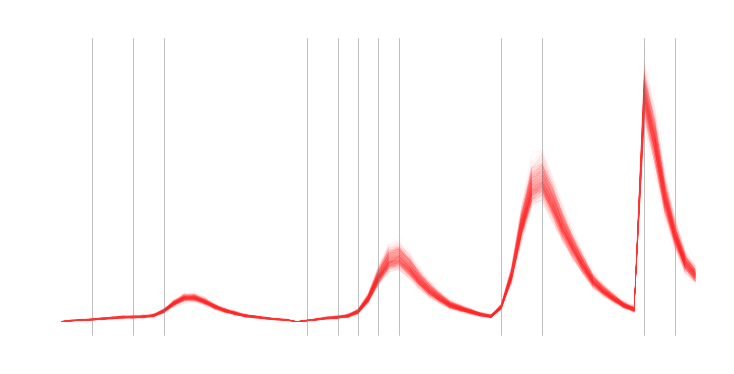

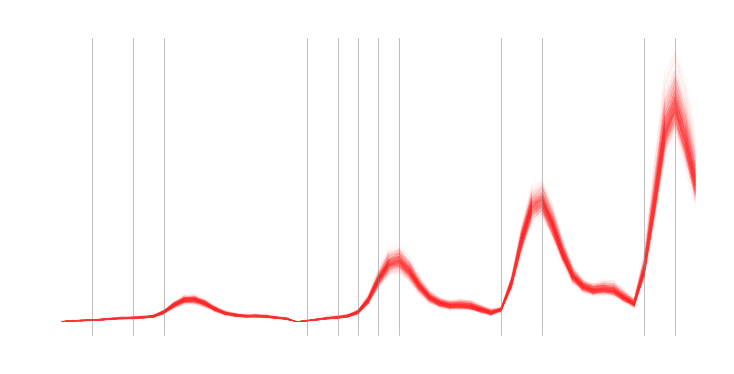

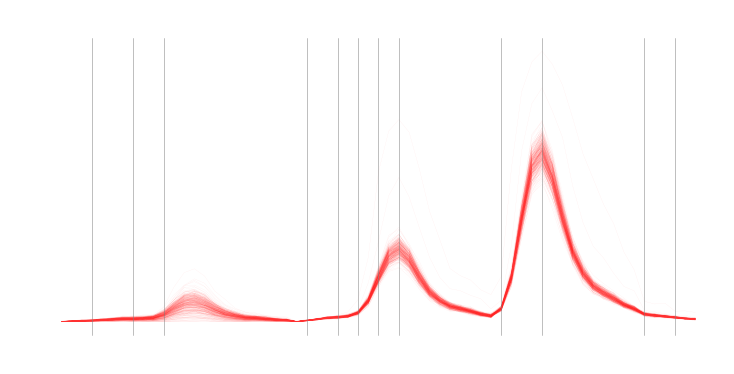

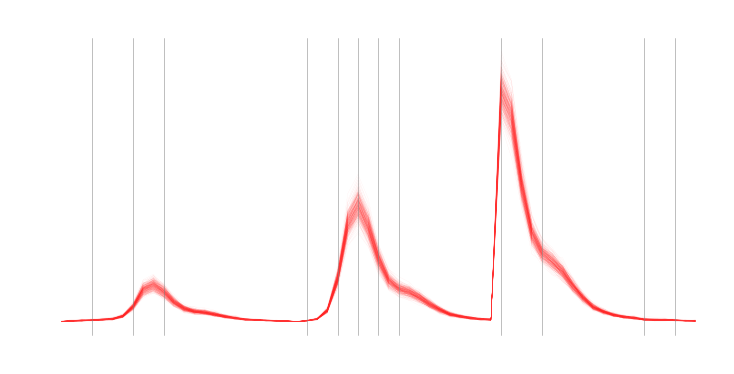

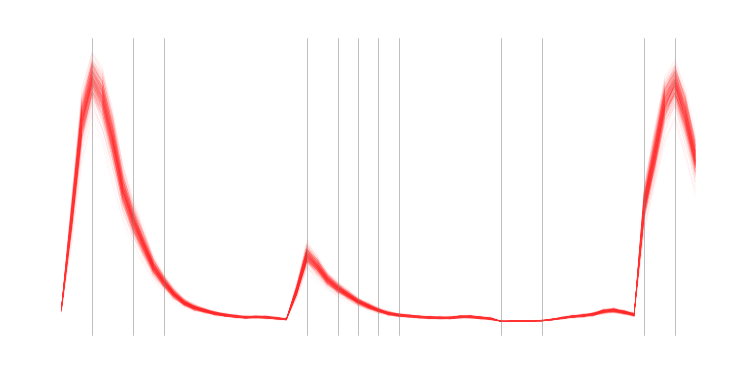

...

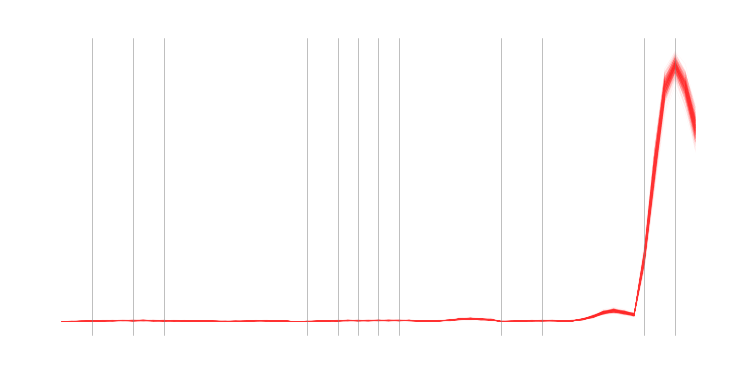

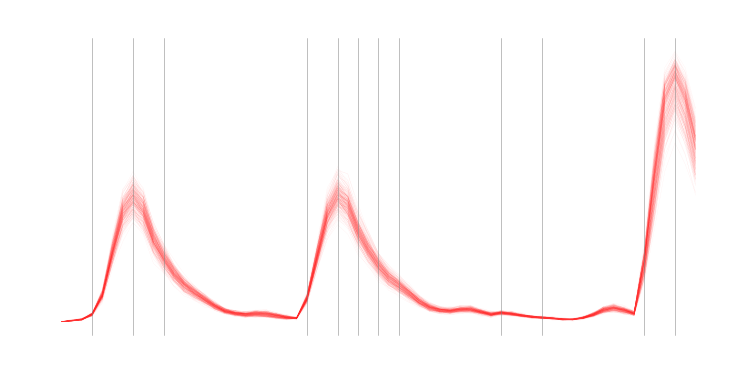

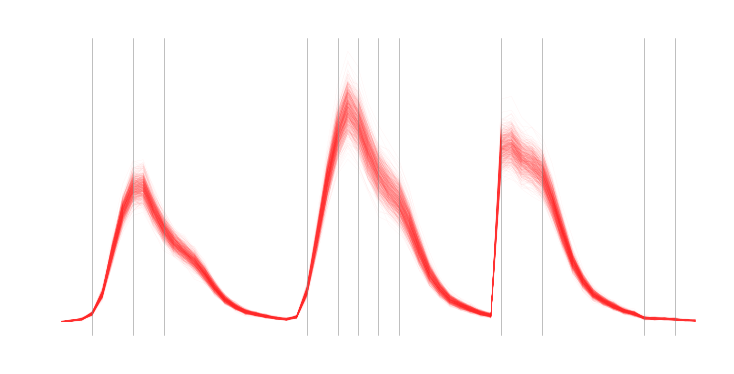

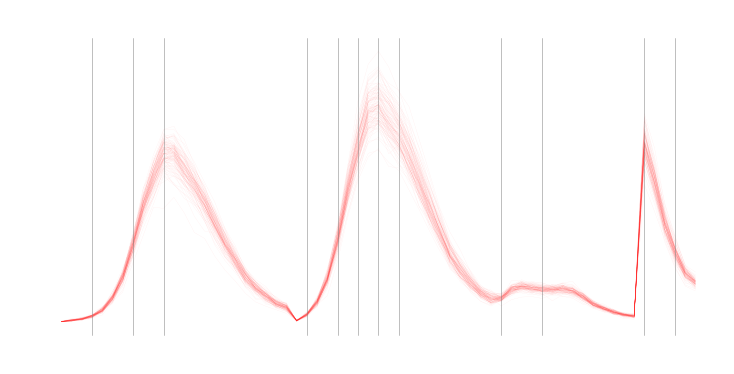

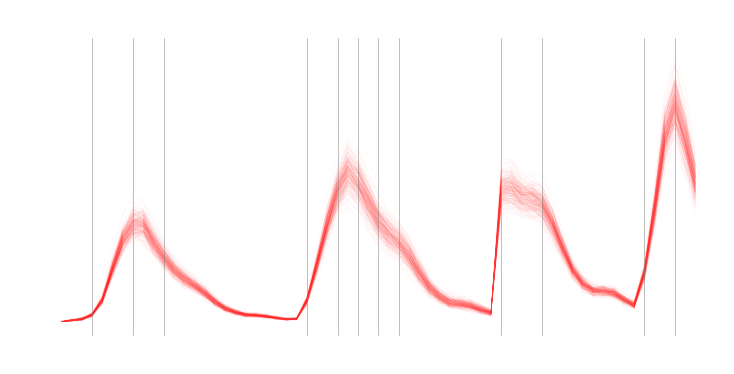

In [19]:

for s, name in zip(ref_spec, sci_names):
    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    fsi.plot_cell_spectra(ax, s, {"lw": 0.2, "alpha": 0.1, "color": "r"})
    ax.set_title(name, color='w')

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x, x], ylim, color=(0.5, 0.5, 0.5), lw=0.5)

## Plot laser maxes

Pick thresholds for each laser

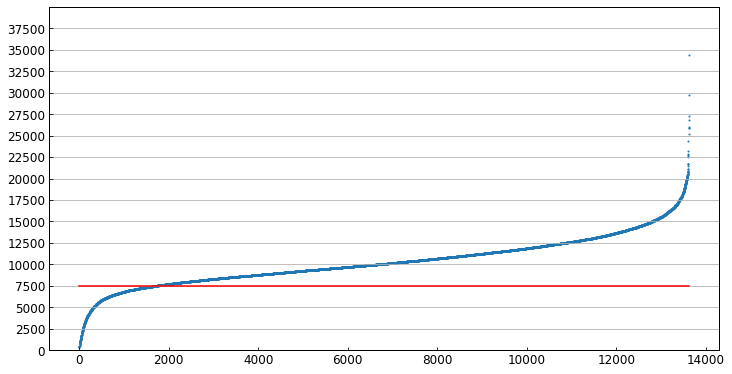

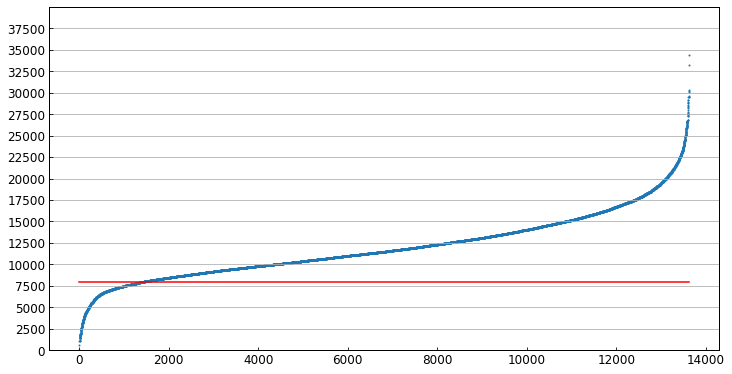

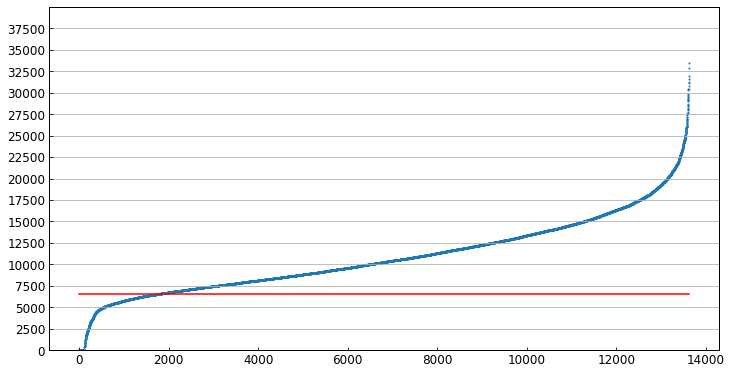

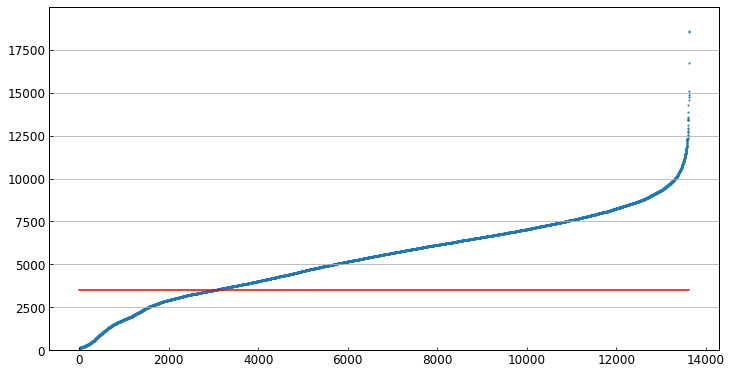

In [87]:
channel_indices = [0,23,43,57,63]
chan_threshs = [7500, 8000, 6500, 3500]

for ci in range(len(channel_indices) - 1):
    chans = np.arange(
        channel_indices[ci], 
        channel_indices[ci+1]
    ).astype(str).tolist()
    spec_sub = props[chans].values
    mxs = np.max(spec_sub, axis=1)
    mxs = np.sort(mxs)

    rnd = 10000

    fig, ax = ip.general_plot(dims=(10,5))
    ax.scatter(np.arange(len(mxs)), mxs, s=1)
    ylim = int(math.ceil(ax.get_ylim()[1] / rnd)) * rnd
    ax.set_ylim(0,ylim)
    ax.set_yticks(np.arange(0, ylim, rnd//4))
    ax.grid(axis='y')

    x = [0, mxs.shape[0]]
    y = [chan_threshs[ci]]*2
    ax.plot(x,y,'r')
    plt.show()


Filter spectra by thresholds

In [88]:
bools = []
for ci in range(len(channel_indices) - 1):
    chans = np.arange(
        channel_indices[ci], 
        channel_indices[ci+1]
    ).astype(str).tolist()
    spec_sub = props[chans].values
    mxs = np.max(spec_sub, axis=1)
    props['las_{}_max'.format(ci)] = mxs

    bools.append(mxs > chan_threshs[ci])

In [196]:
bools_or = sum(bools).astype(bool)
props_filt = props[bools_or]
props_filt.shape

(13442, 85)

Cluster spectra

In [113]:
chans = np.arange(channel_indices[-1]).astype(str).tolist()
spec_arr = props[chans].values
spec_arr_filt = props_filt[chans].values

Got pdist
Got square matrix
Got clustering


/home/bmg224/miniconda3/envs/hiprfish_imaging_py38/lib/python3.8/site-packages/umap/umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


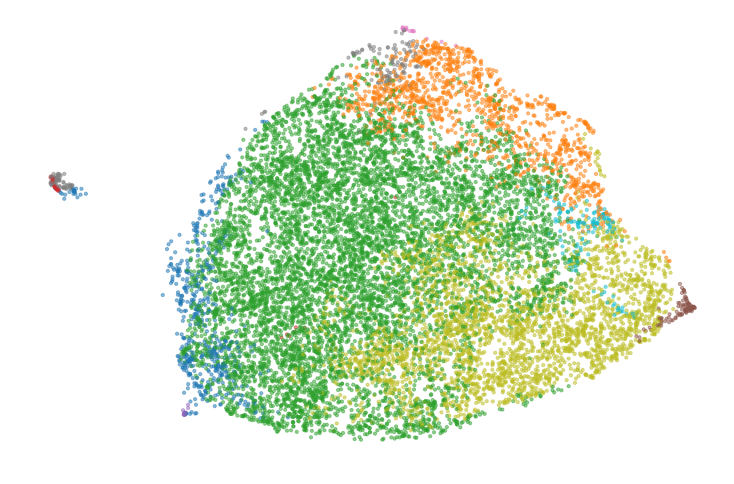

In [91]:
n_clust = 10
umap_dims = (10,10)
s_u = 10
alpha_u=0.5
cmap_u='tab10'

dist_mat_cond = pdist(spec_arr_filt, fhc.channel_cosine_intensity_allonev2)
print('Got pdist')
# Make squareform
dist_mat = squareform(dist_mat_cond)
print('Got square matrix')
# Agglomerative cluster
agg = AgglomerativeClustering(
    n_clusters=n_clust, 
    affinity='precomputed', 
    linkage='complete'
)
agg.fit(dist_mat)
clust_agg = agg.labels_ 
# clust_fn = clust_fmt.format(date=wildcards.date, sn=wildcards.sn, M_half=nm)
print('Got clustering')
# Plot umap
fig, ax = ip.general_plot(dims=umap_dims, col='w')
fit = umap.UMAP(
    metric='precomputed', 
    n_neighbors=100, 
    min_dist=0.1
).fit(dist_mat)
u = fit.embedding_
ax.scatter(
    u[:,0], u[:,1], 
    c=clust_agg, 
    s=s_u, 
    alpha=alpha_u, 
    cmap=cmap_u
)
ax.set_aspect('equal')


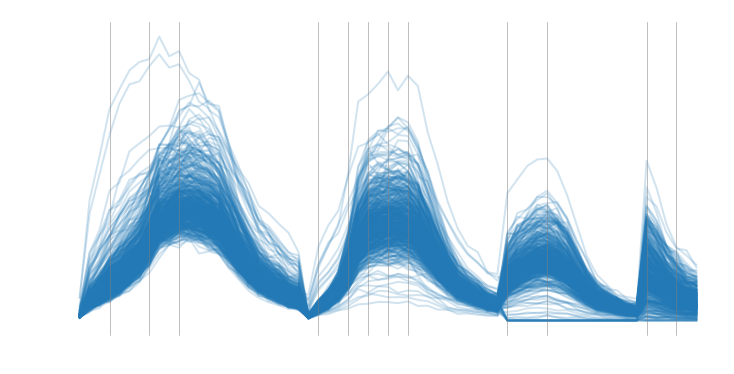

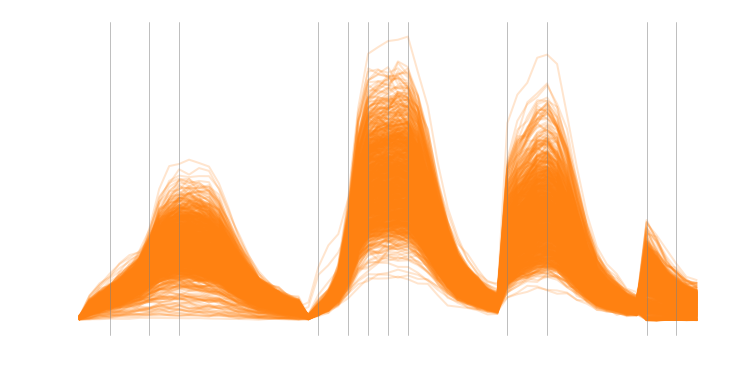

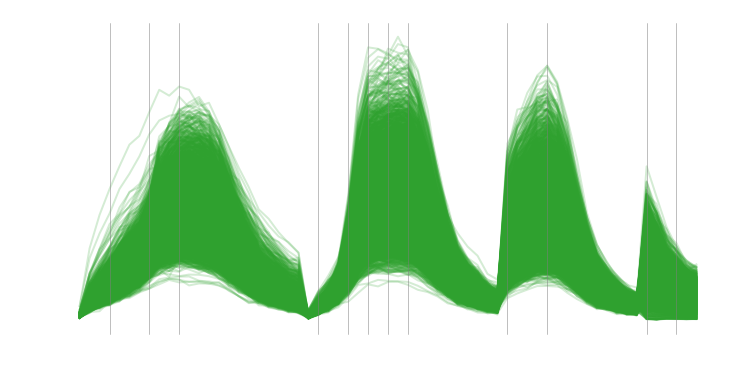

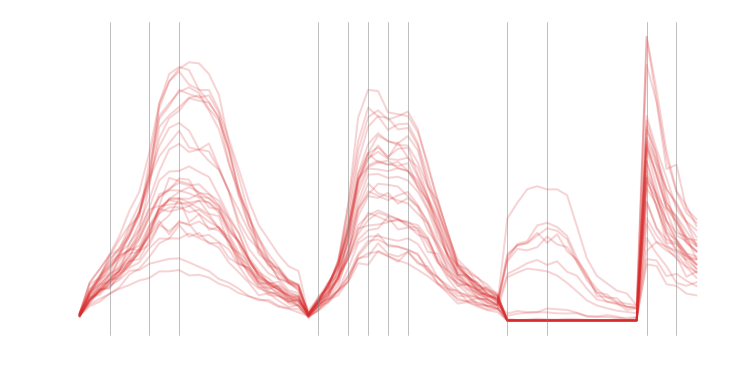

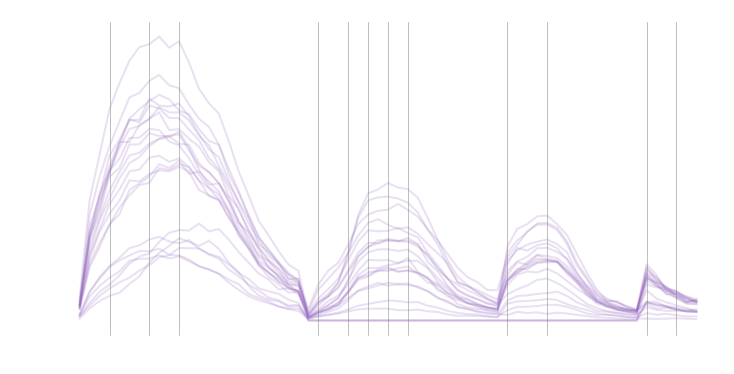

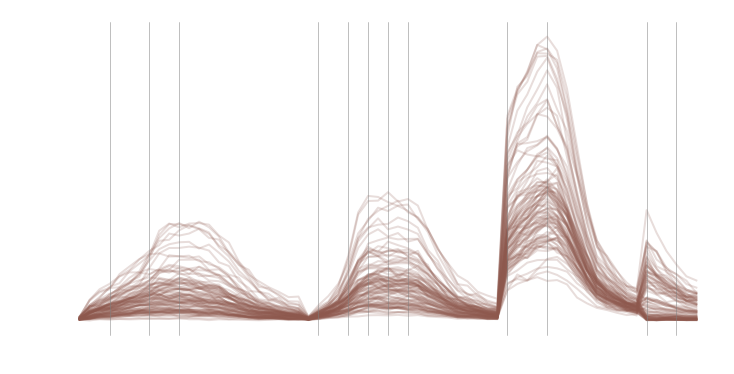

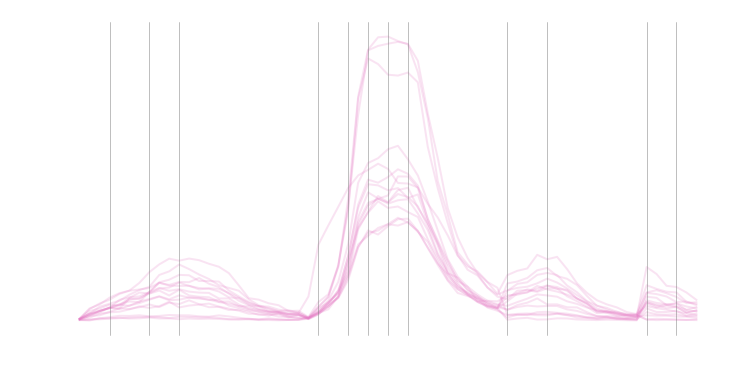

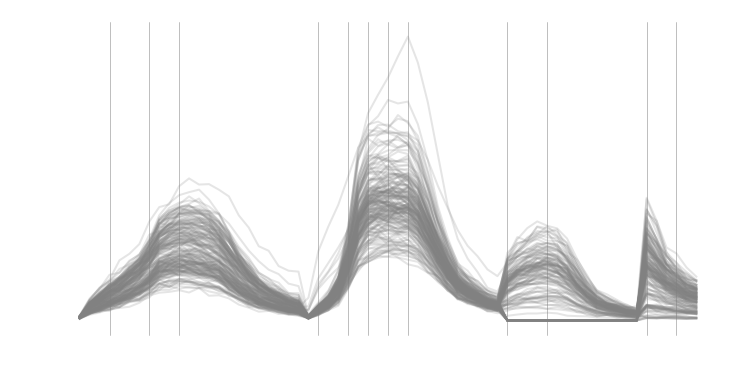

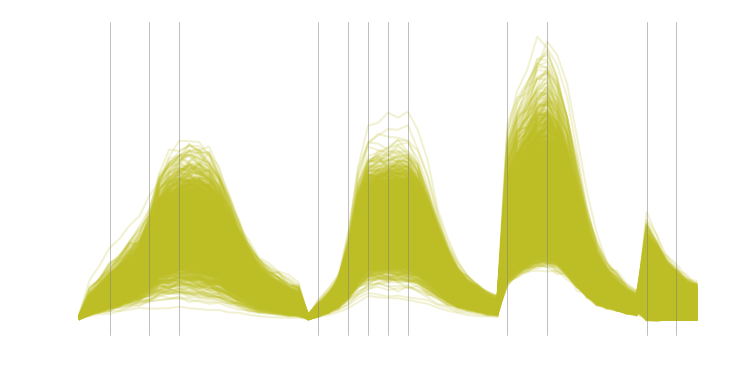

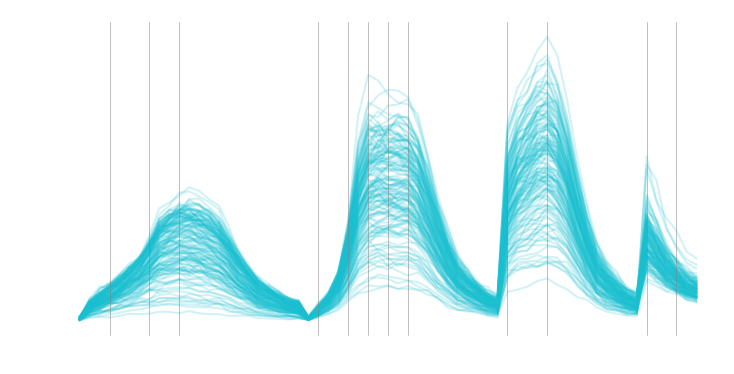

In [92]:

colors = plt.get_cmap(cmap_u)(np.linspace(0,1,n_clust))
dict_clust_col = dict(zip(np.arange(n_clust), colors))
# Plot spectra 
for c in np.unique(clust_agg):
    # print('Cluster:', c)
    bool_c = clust_agg == c
    spec_sub = spec_arr_filt[bool_c,:]

    # spec_sub_meansub = spec_sub - specs_med
    # spec_sub_meansub[spec_sub_meansub < 0] = 0

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    color = dict_clust_col[c]
    # fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
    fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':color})

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)
    


Plot filtered spectra

In [93]:
props_removed = props.loc[~bools_or,:]
spec_removed = props_removed[chans].values
props_removed.shape

(178, 85)

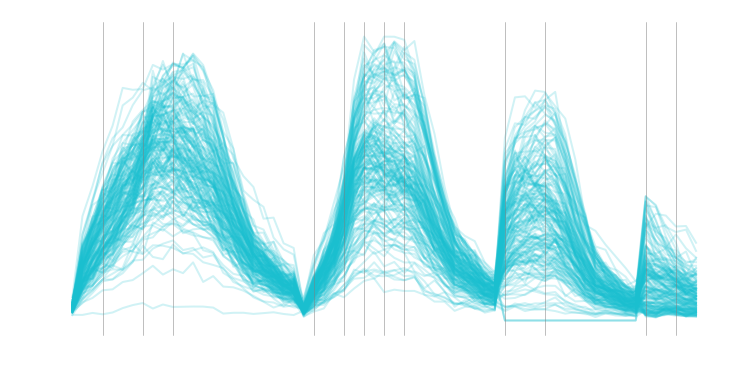

In [94]:

fig, ax = ip.general_plot(dims=spec_dims, col='w')
color = dict_clust_col[c]
# fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
fsi.plot_cell_spectra(ax, spec_removed, {'lw':2,'alpha':0.2,'color':color})

ylim = ax.get_ylim()

for x in xs:
    ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)

Got pdist
Got square matrix
Got clustering


/home/bmg224/miniconda3/envs/hiprfish_imaging_py38/lib/python3.8/site-packages/umap/umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


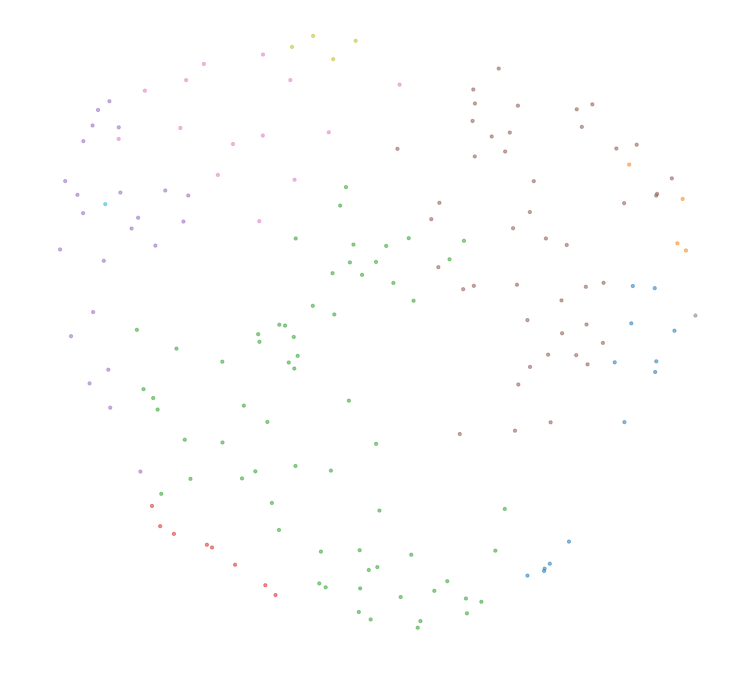

In [95]:
n_clust = 10
umap_dims = (10,10)
s_u = 10
alpha_u=0.5
cmap_u='tab10'

dist_mat_cond_r = pdist(spec_removed, fhc.channel_cosine_intensity_allonev2)
print('Got pdist')
# Make squareform
dist_mat_r = squareform(dist_mat_cond_r)
print('Got square matrix')
# Agglomerative cluster
agg_r = AgglomerativeClustering(
    n_clusters=n_clust, 
    affinity='precomputed', 
    linkage='complete'
)
agg_r.fit(dist_mat_r)
clust_agg_r = agg_r.labels_ 
# clust_fn = clust_fmt.format(date=wildcards.date, sn=wildcards.sn, M_half=nm)
print('Got clustering')
# Plot umap
fig, ax = ip.general_plot(dims=umap_dims, col='w')
fit = umap.UMAP(
    metric='precomputed', 
    n_neighbors=100, 
    min_dist=0.1
).fit(dist_mat_r)
u = fit.embedding_
ax.scatter(
    u[:,0], u[:,1], 
    c=clust_agg_r, 
    s=s_u, 
    alpha=alpha_u, 
    cmap=cmap_u
)
ax.set_aspect('equal')


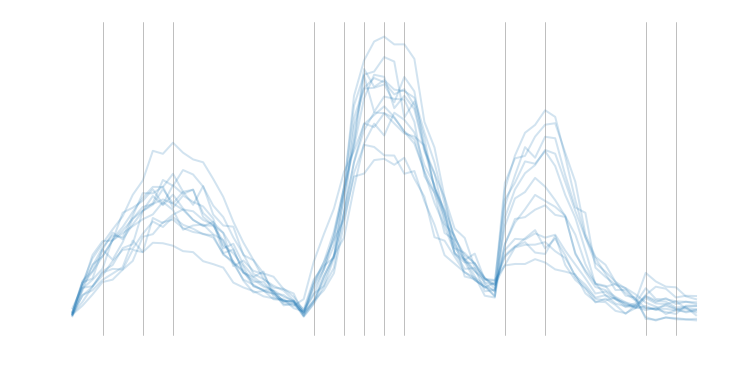

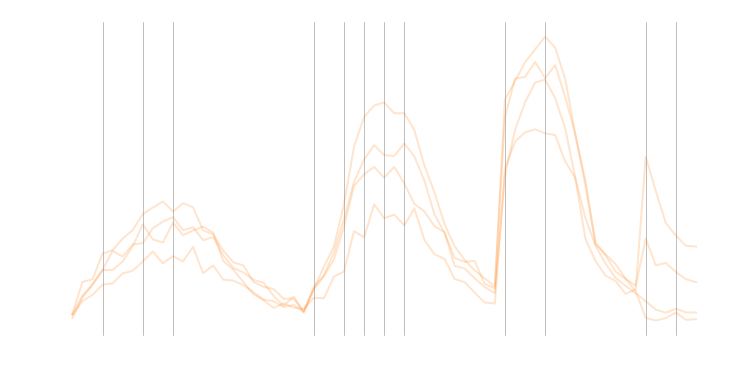

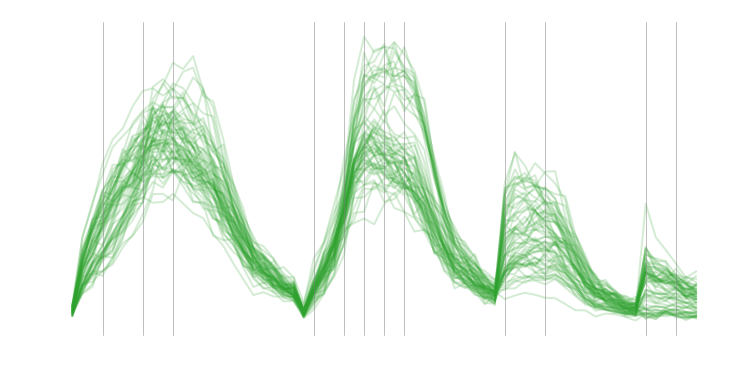

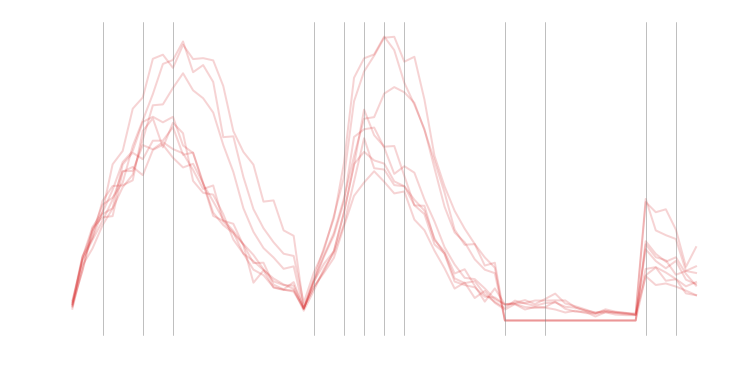

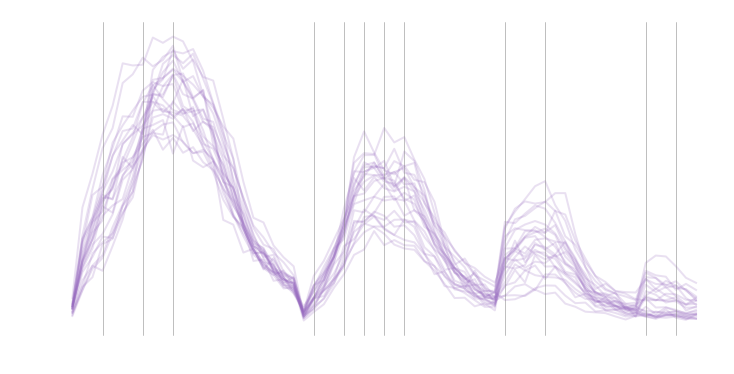

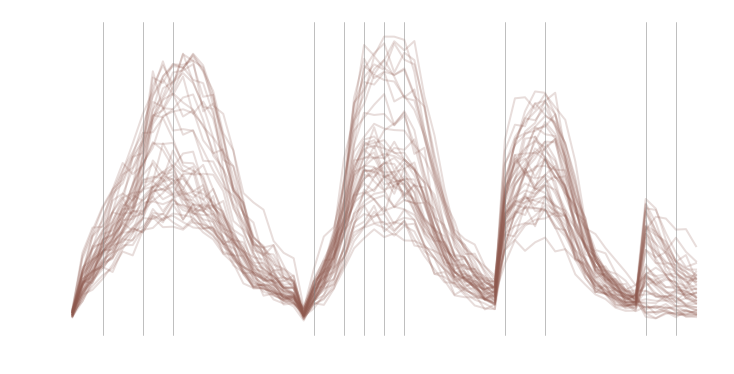

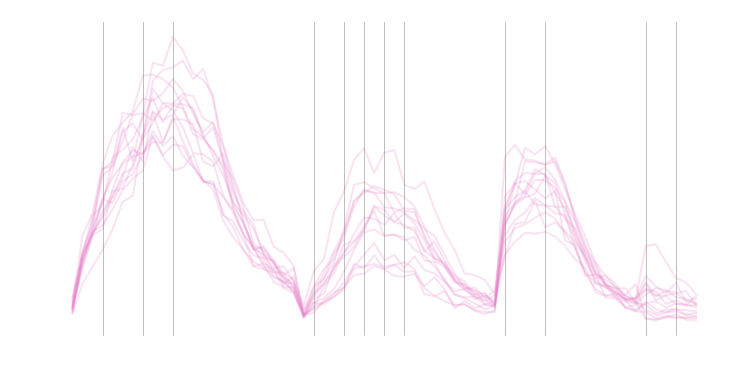

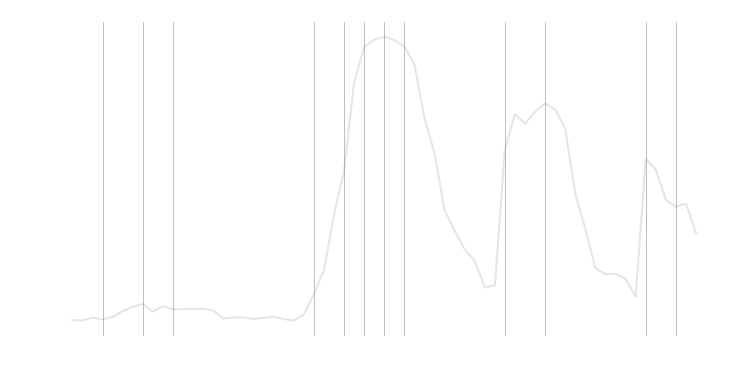

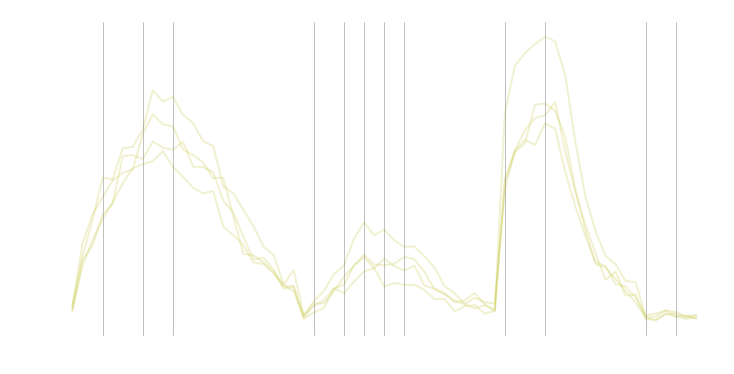

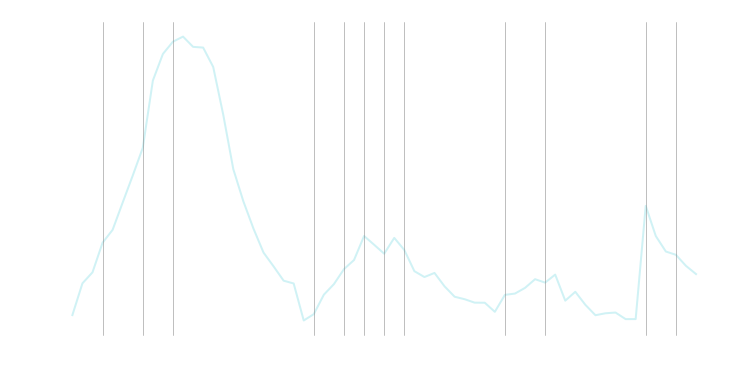

In [96]:
colors = plt.get_cmap(cmap_u)(np.linspace(0,1,n_clust))
dict_clust_col = dict(zip(np.arange(n_clust), colors))
# Plot spectra 
for c in np.unique(clust_agg_r):
    # print('Cluster:', c)
    bool_c = clust_agg_r == c
    spec_sub = spec_removed[bool_c,:]

    # spec_sub_meansub = spec_sub - specs_med
    # spec_sub_meansub[spec_sub_meansub < 0] = 0

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    color = dict_clust_col[c]
    # fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
    fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':color})

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)
    


## Subtract background

Pick background

In [97]:
bg_r = np.max(spec_removed, axis=0)

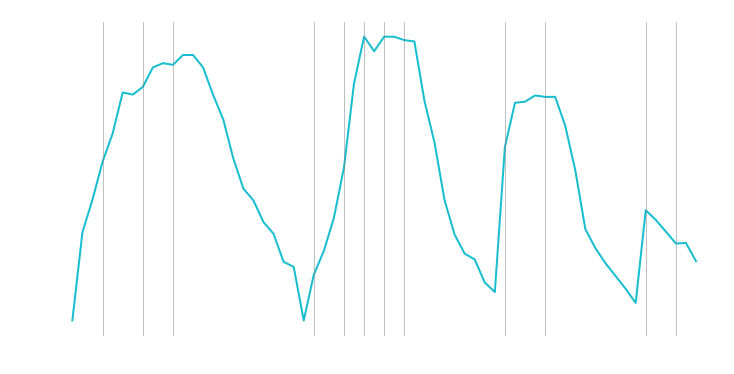

In [100]:

fig, ax = ip.general_plot(dims=spec_dims, col='w')
color = dict_clust_col[c]
# fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
fsi.plot_cell_spectra(ax, np.array([bg_r]), {'lw':2,'alpha':1,'color':color})

ylim = ax.get_ylim()

for x in xs:
    ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)

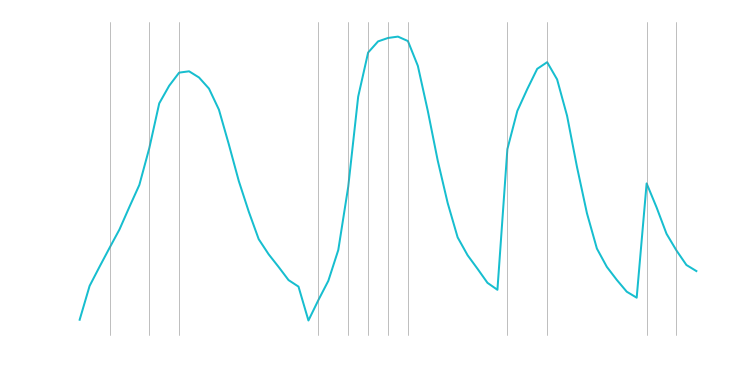

In [101]:
bg_med = np.median(spec_arr, axis=0)

fig, ax = ip.general_plot(dims=spec_dims, col='w')
color = dict_clust_col[c]
# fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
fsi.plot_cell_spectra(ax, np.array([bg_med]), {'lw':2,'alpha':1,'color':color})

ylim = ax.get_ylim()

for x in xs:
    ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)

Get minimum of laser maxima

In [107]:
# maxs_cols = ['las_{}_max'.format(i) for i in range(4)]
# maxs_arr = props.copy()[maxs_cols].values
# maxs_arr[maxs_arr == 0] = 1e10
# maxs_arr_min = np.min(maxs_arr, axis=1)
# maxs_arr_min.shape

(13620,)

Scale background to sum of each cell spectrum

In [116]:
row_sums = np.sum(spec_arr, axis=1)
bg_med_norm = bg_med / np.sum(bg_med)


Subtract bg from spectra 

In [121]:
bg_mat = np.matmul(row_sums[:,None], bg_med_norm[None,:])
spec_arr_bgsub = spec_arr - bg_mat
np.min(spec_arr_bgsub)

-12652.517306288682

### Move spectra minimum up to zero

In [120]:
sab_row_min = np.min(spec_arr_bgsub, axis=1)
spec_arr_bgsub_zeroed = spec_arr_bgsub - sab_row_min[:,None]
np.min(spec_arr_bgsub_zeroed)

0.0

Plot clusters again

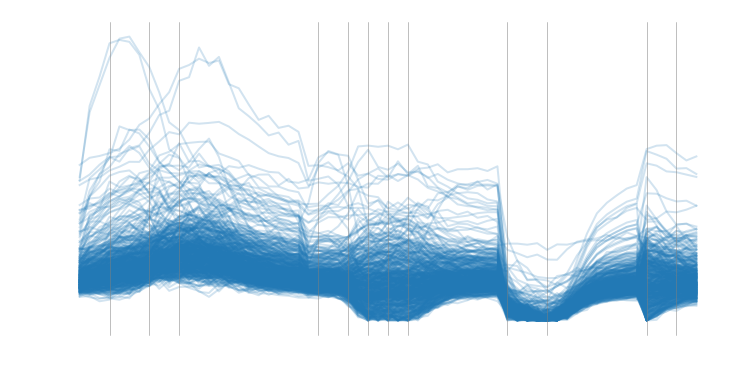

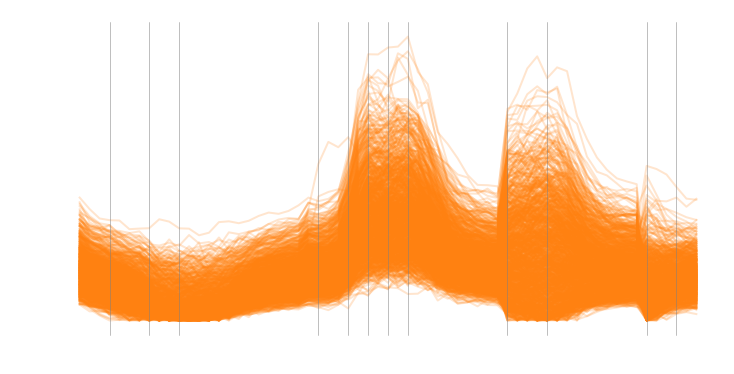

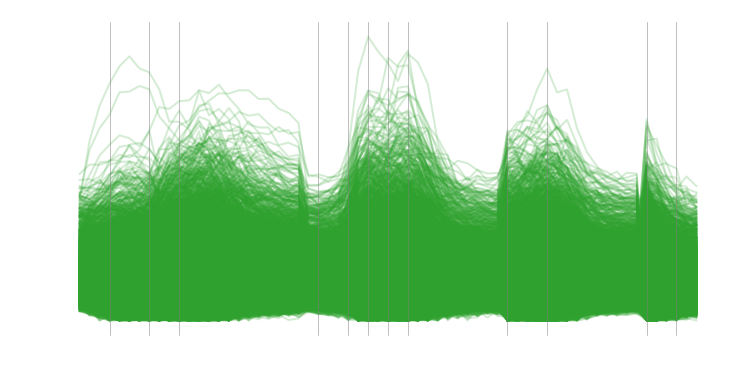

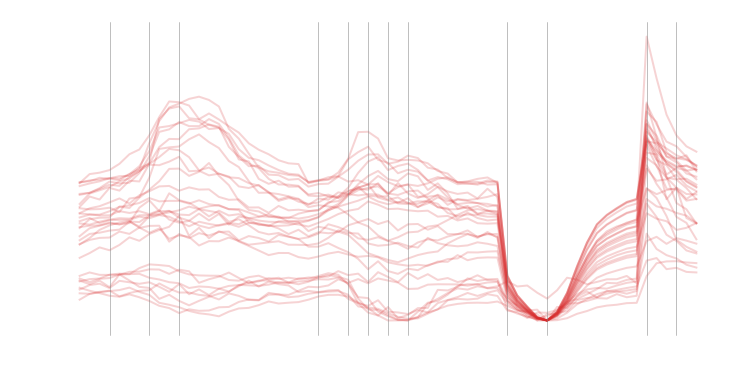

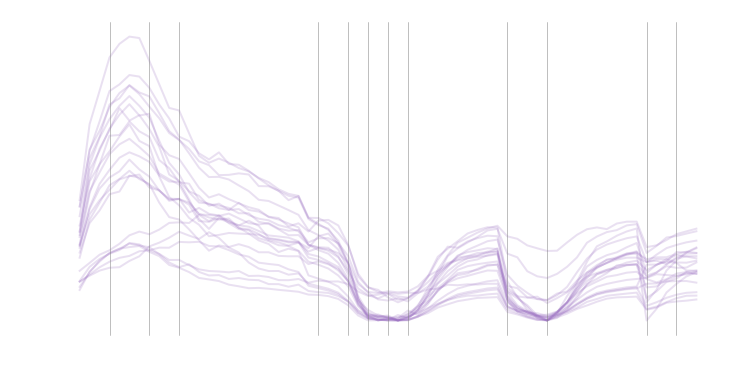

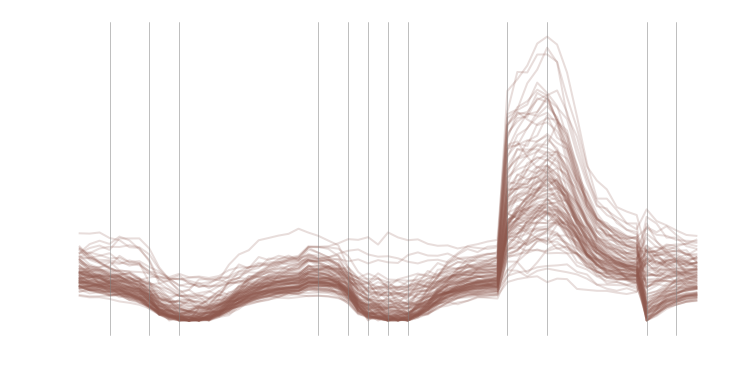

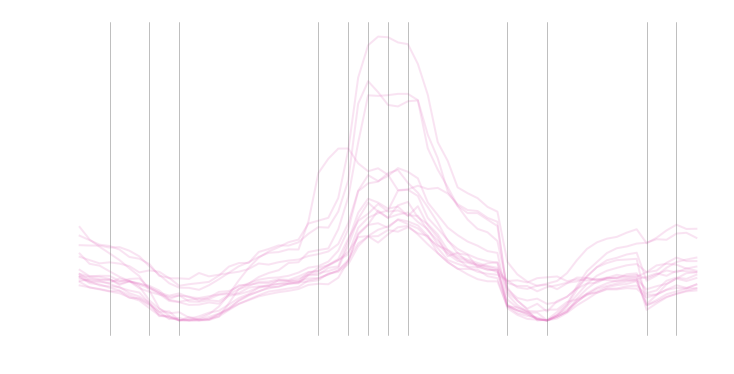

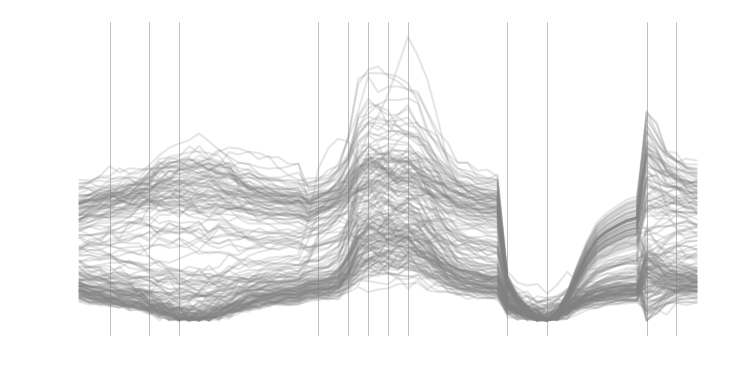

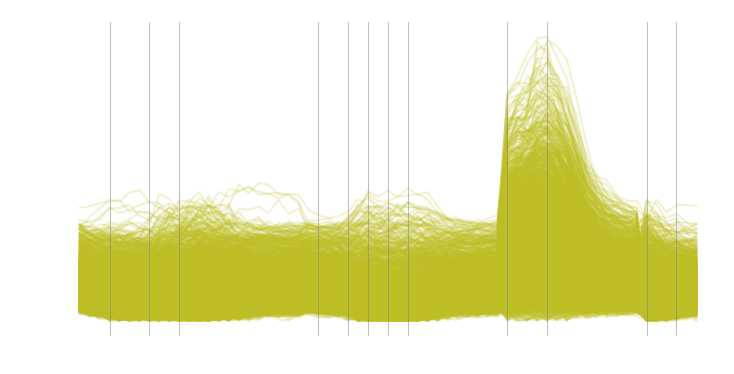

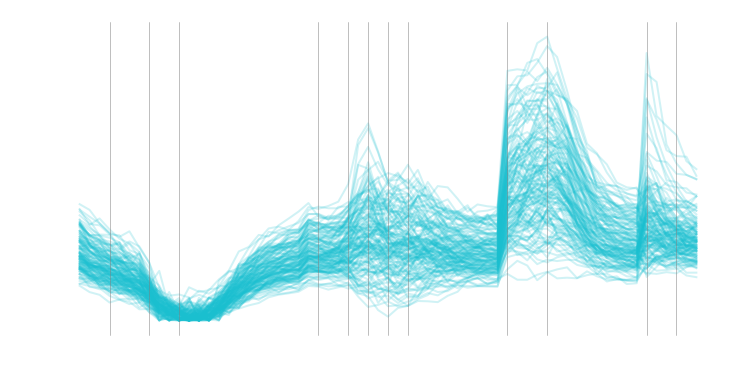

In [122]:
spec_arr_bgsub_zeroed_filt = spec_arr_bgsub_zeroed[bools_or,:]


colors = plt.get_cmap(cmap_u)(np.linspace(0,1,n_clust))
dict_clust_col = dict(zip(np.arange(n_clust), colors))
# Plot spectra 
for c in np.unique(clust_agg):
    # print('Cluster:', c)
    bool_c = clust_agg == c
    spec_sub = spec_arr_bgsub_zeroed_filt[bool_c,:]

    # spec_sub_meansub = spec_sub - specs_med
    # spec_sub_meansub[spec_sub_meansub < 0] = 0

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    color = dict_clust_col[c]
    # fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
    fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':color})

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)
    


### Zero out negatives

In [145]:
spec_arr_bgsub_negzero = spec_arr_bgsub.copy()
spec_arr_bgsub_negzero[spec_arr_bgsub_negzero < 0] = 0


Plot clusters again

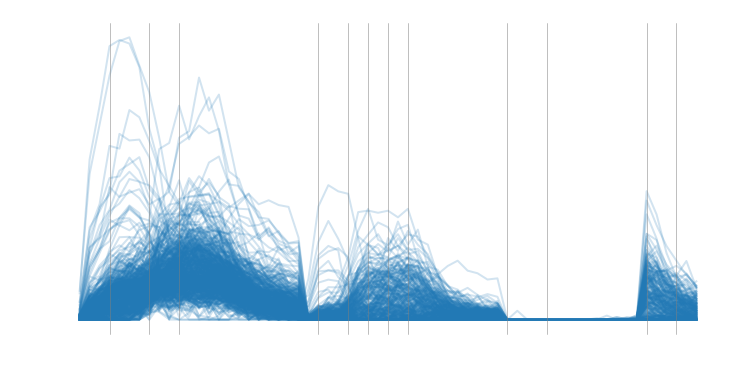

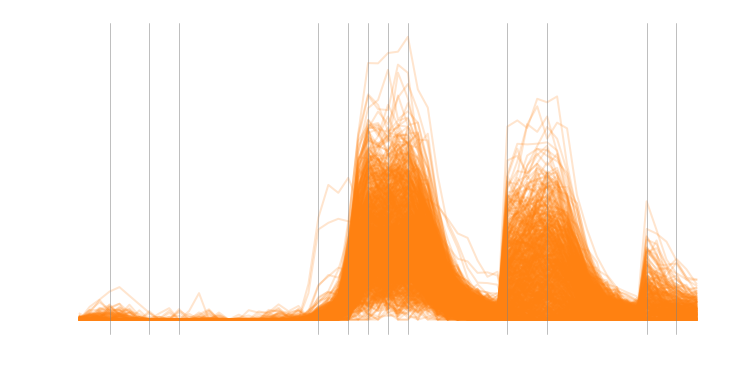

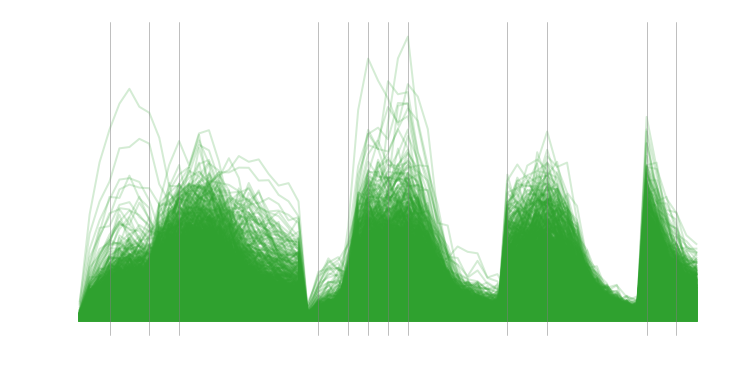

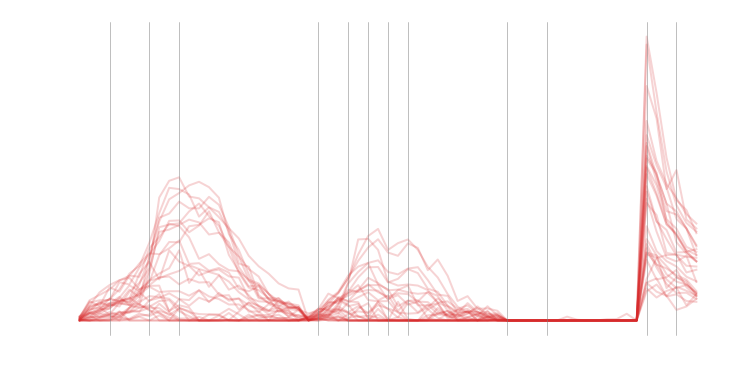

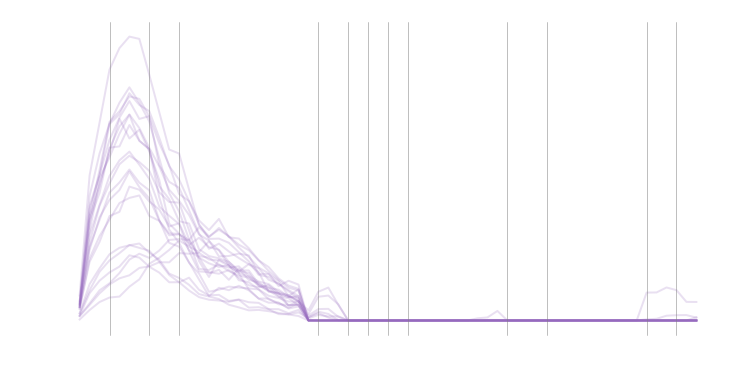

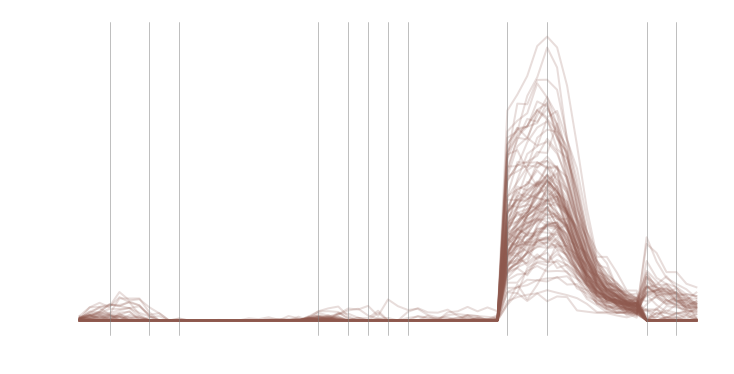

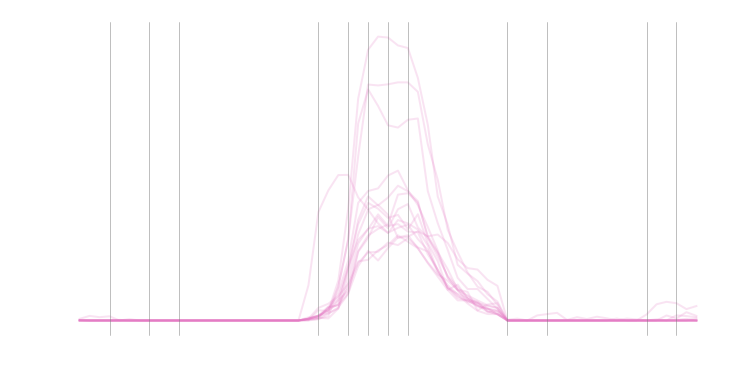

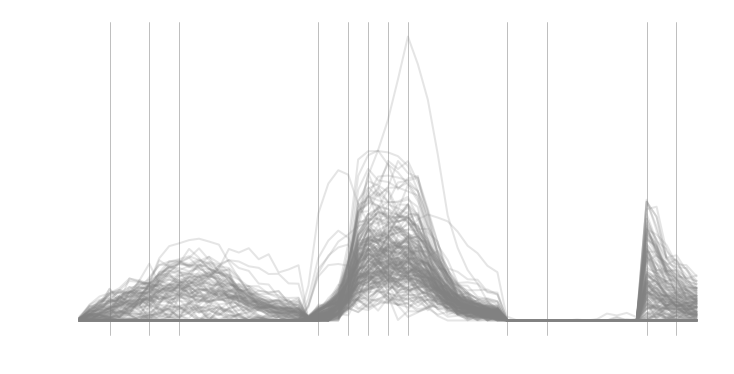

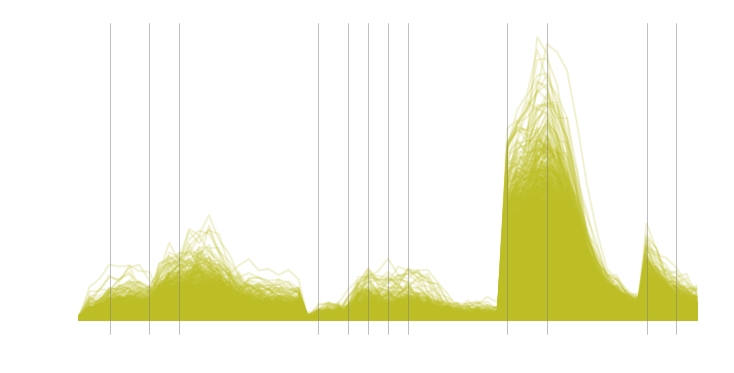

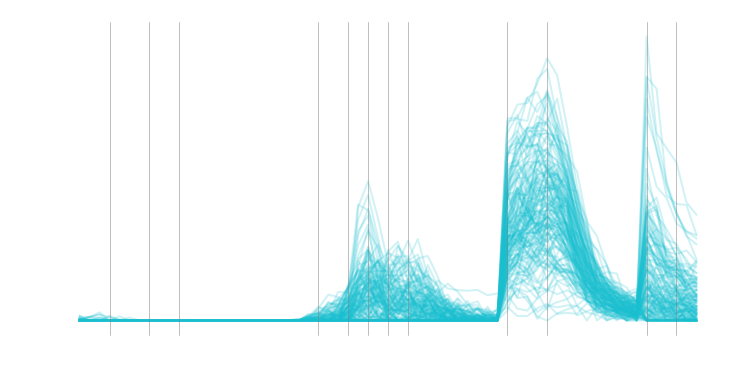

In [146]:
spec_arr_bgsub_negzero_filt = spec_arr_bgsub_negzero[bools_or,:]


colors = plt.get_cmap(cmap_u)(np.linspace(0,1,n_clust))
dict_clust_col = dict(zip(np.arange(n_clust), colors))
# Plot spectra 
for c in np.unique(clust_agg):
    # print('Cluster:', c)
    bool_c = clust_agg == c
    spec_sub = spec_arr_bgsub_negzero_filt[bool_c,:]

    # spec_sub_meansub = spec_sub - specs_med
    # spec_sub_meansub[spec_sub_meansub < 0] = 0

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    color = dict_clust_col[c]
    # fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
    fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':color})

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)
    


## Classify based on subtracted spectra

In [138]:
ref_spec_med = [np.median(r, axis=0) for r in ref_spec]
ref_spec_arr = np.vstack(ref_spec_med)
# ref_spec_dist_mat_cond = pdist(
#     ref_spec_arr, fhc.channel_cosine_intensity_allonev2
# )
# ref_spec_dist_mat = squareform(ref_spec_dist_mat_cond)
# nbrs = NearestNeighbors(n_neighbors=1, metric='precomputed')
# nn_ref = nbrs.fit(ref_spec_dist_mat)

### Cosine distance

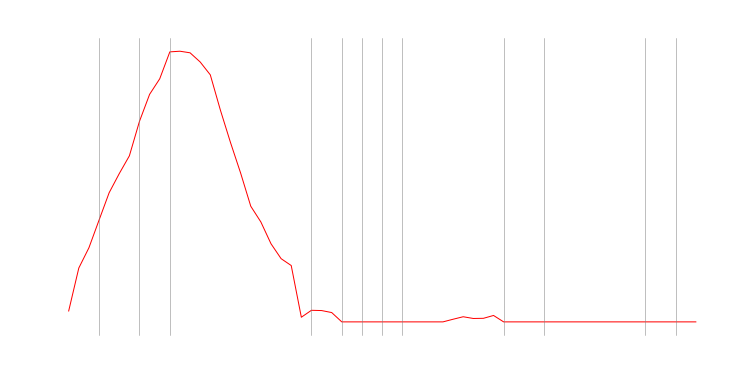

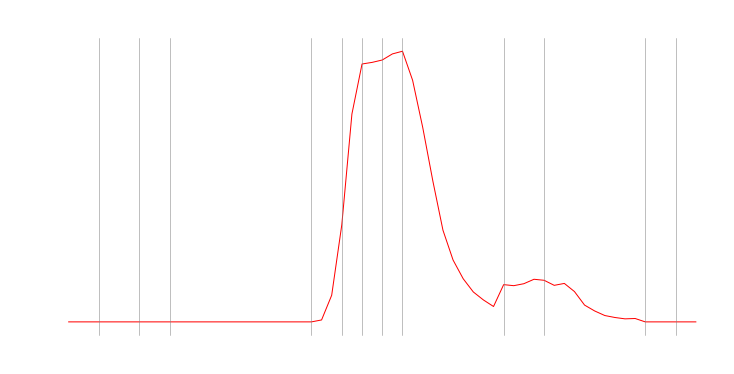

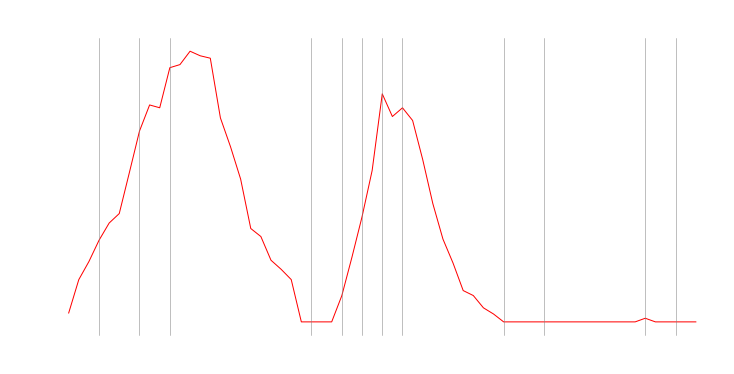

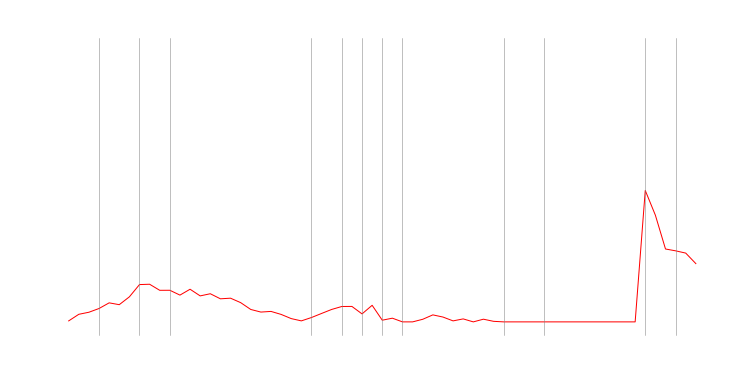

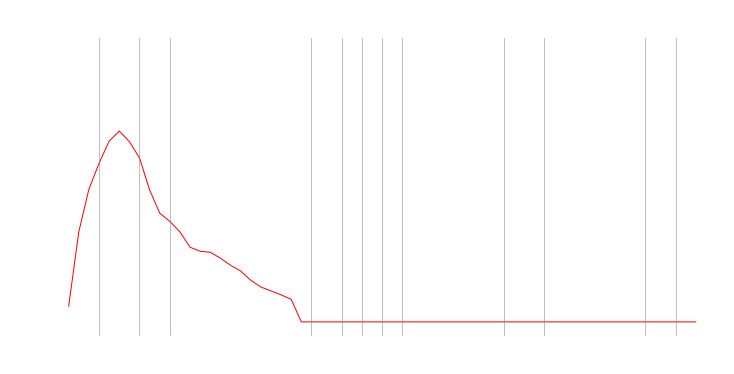

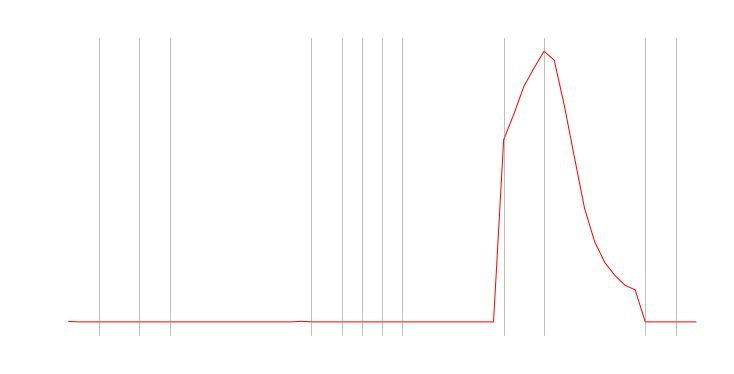

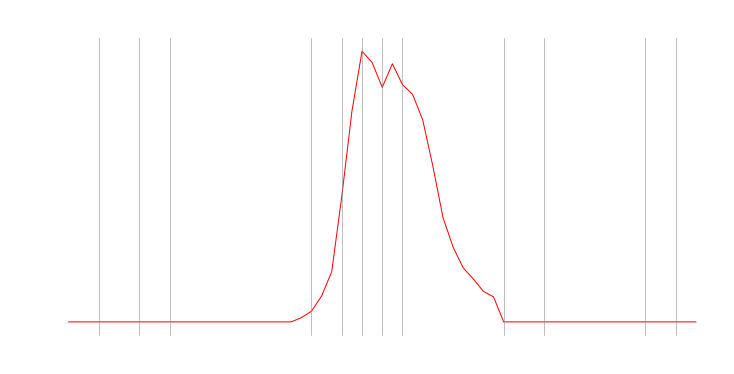

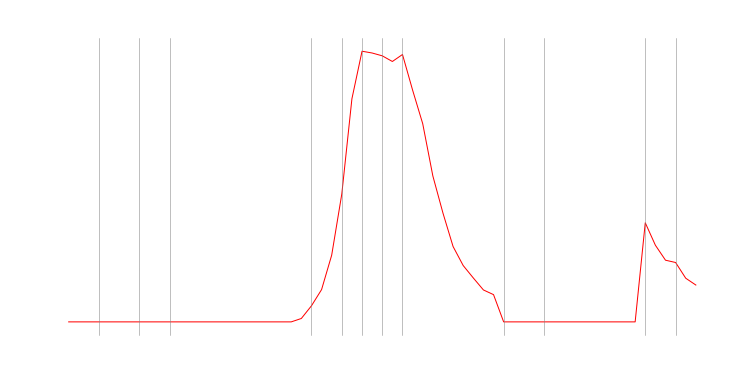

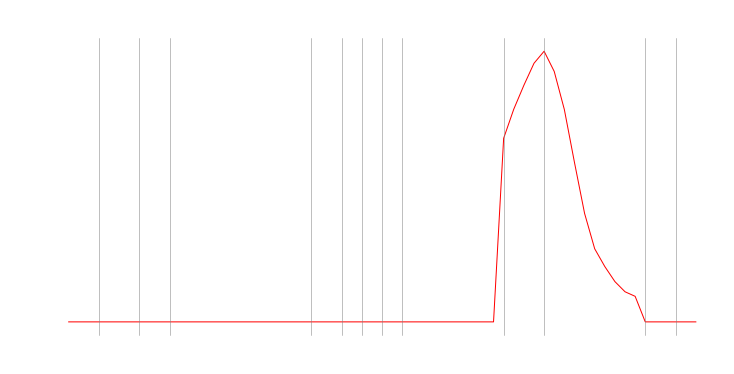

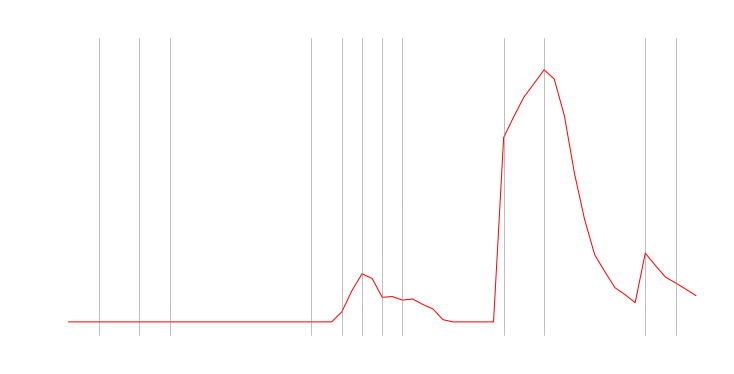

In [149]:
cl_unq = np.unique(clust_agg)

# Iterate through clusters and classify
dict_cl_bc = {}
for cl in cl_unq:
    spec = spec_arr_bgsub_negzero_filt[clust_agg == cl]
    spec_mean = np.median(spec, axis=0)[None, :]

    # Get distances
    cl_dist_matrix = cdist(
            spec_mean, 
            ref_spec_arr, 
            metric=fhc.channel_cosine_intensity_allonev2
        )
    # Classify each spectrum
    # nn_dists, nn_inds = nn_ref.kneighbors(cl_dist_matrix)
    rs_ind = np.argmin(cl_dist_matrix)
    bc = barcodes[rs_ind]
    sciname = sci_names[rs_ind]
    dict_cl_bc[cl] = sciname

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    rs = ref_spec_med[rs_ind][None,:]
    rs = rs / np.sum(rs)
    sm = (spec_mean / np.sum(spec_mean))
    fsi.plot_cell_spectra(ax, rs, {"lw": 1, "alpha": 1, "color": "w"})                    
    fsi.plot_cell_spectra(ax, sm, {"lw": 1, "alpha": 1, "color": "r"})                    
    ylim = ax.get_ylim()
    for x in xs:
        ax.plot([x, x], ylim, color=(0.5, 0.5, 0.5), lw=0.5)
    ax.set_title(sciname + ': ' + str(bc), color='w')

### matrix mult Max 

In [152]:
ref_spec_arr_sumnorm = ref_spec_arr / np.sum(ref_spec_arr, axis=1)[:,None]
np.sum(ref_spec_arr_sumnorm, axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1.])

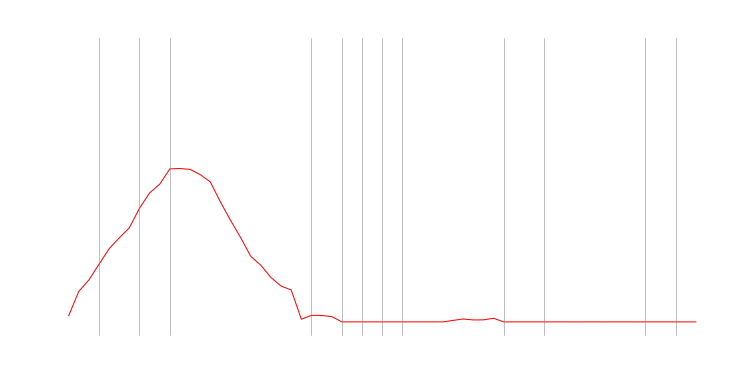

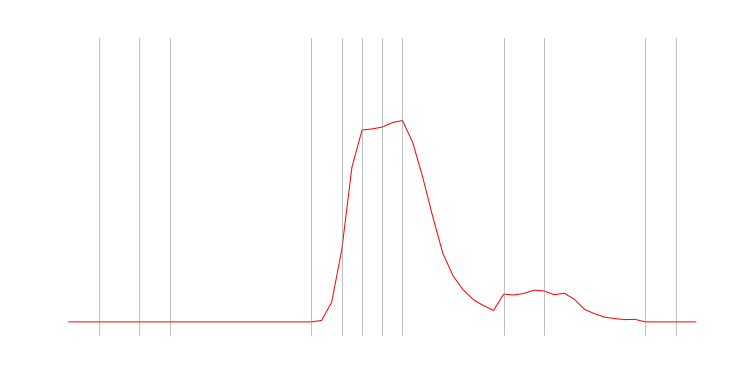

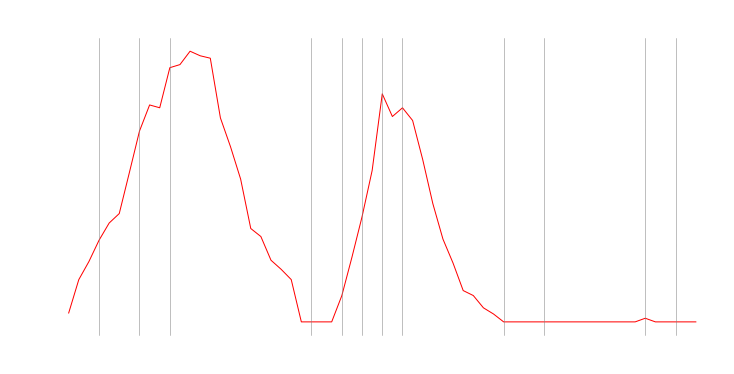

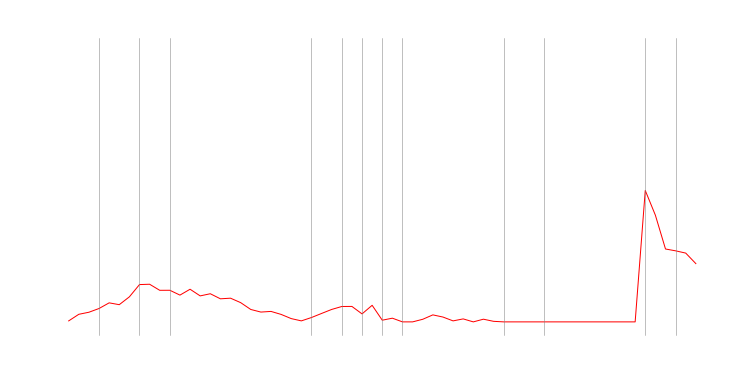

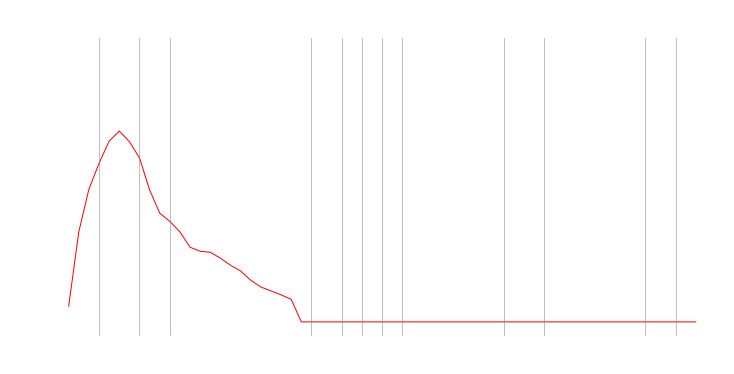

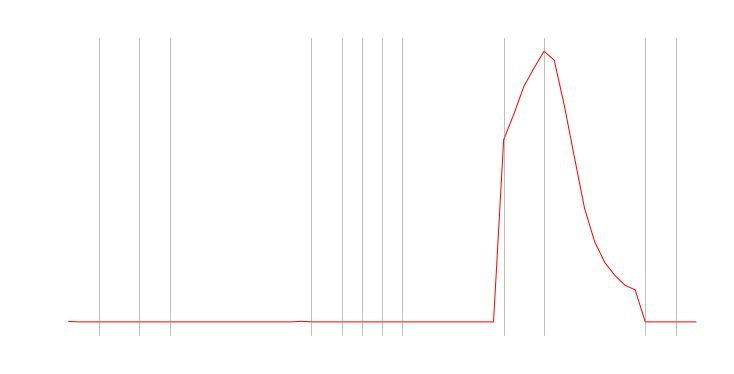

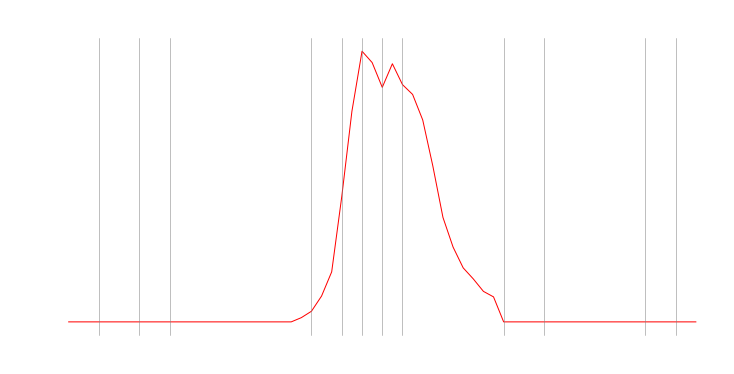

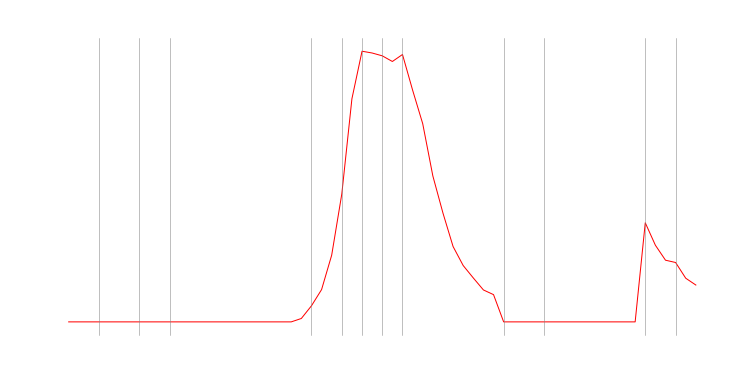

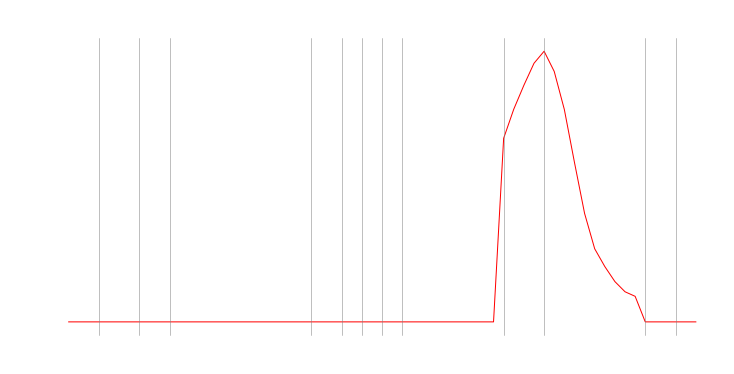

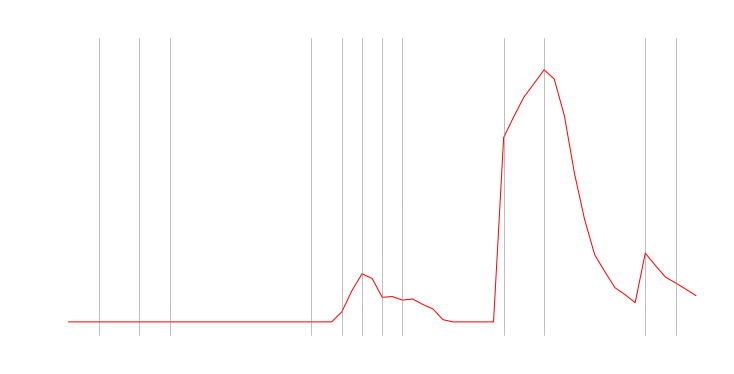

In [157]:
cl_unq = np.unique(clust_agg)

# Iterate through clusters and classify
dict_cl_bc = {}
for cl in cl_unq:
    spec = spec_arr_bgsub_negzero_filt[clust_agg == cl]
    spec_mean = np.median(spec, axis=0)[None, :]

    # Get sum
    mat_mul = spec_mean * ref_spec_arr_sumnorm
    mat_mul_sum = np.sum(mat_mul, axis=1)

    # Classify each spectrum
    # nn_dists, nn_inds = nn_ref.kneighbors(cl_dist_matrix)
    rs_ind = np.argmax(mat_mul_sum)
    bc = barcodes[rs_ind]
    sciname = sci_names[rs_ind]
    dict_cl_bc[cl] = sciname

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    rs = ref_spec_med[rs_ind][None,:]
    rs = rs / np.sum(rs)
    sm = (spec_mean / np.sum(spec_mean))
    fsi.plot_cell_spectra(ax, rs, {"lw": 1, "alpha": 1, "color": "w"})                    
    fsi.plot_cell_spectra(ax, sm, {"lw": 1, "alpha": 1, "color": "r"})                    
    ylim = ax.get_ylim()
    for x in xs:
        ax.plot([x, x], ylim, color=(0.5, 0.5, 0.5), lw=0.5)
    ax.set_title(sciname + ': ' + str(bc), color='w')

## Cellwise classif

### cosine distance

In [170]:
# Get distances
cl_dist_matrix = cdist(
        spec_arr_bgsub_negzero_filt, 
        ref_spec_arr, 
        metric=fhc.channel_cosine_intensity_allonev2
    )
cl_dist_matrix.shape


(13442, 18)

Get indices of min

In [171]:
# Classify each spectrum
# nn_dists, nn_inds = nn_ref.kneighbors(cl_dist_matrix)
rs_ind = np.argmin(cl_dist_matrix, axis=1)
rs_ind.shape

(13442,)

Get sciname for each cell

In [172]:
scinames_cosdist = np.array([sci_names[i] for i in rs_ind])

Plot Scinames and ref

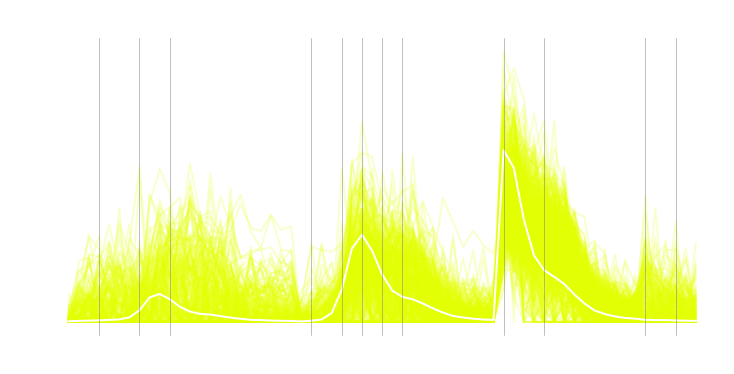

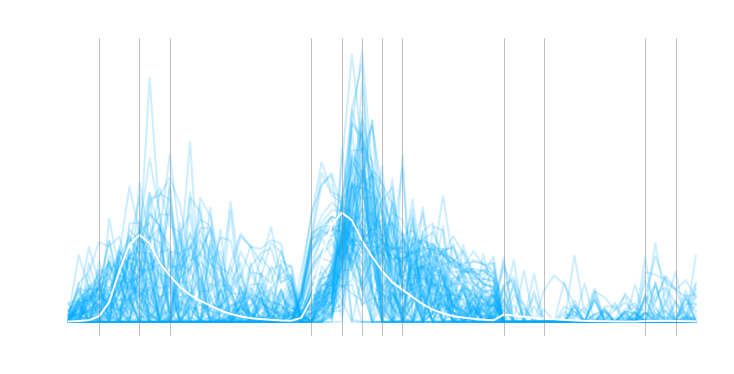

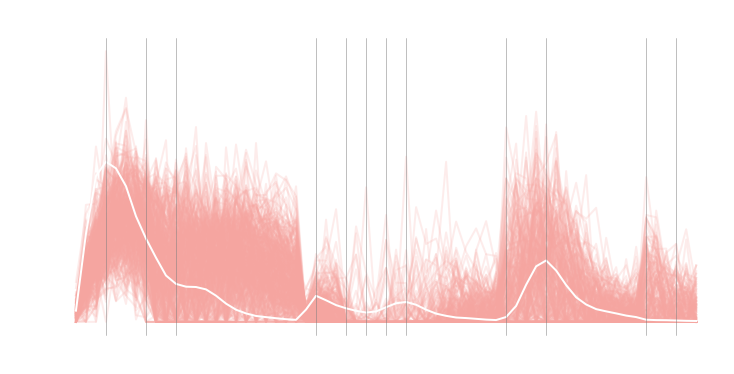

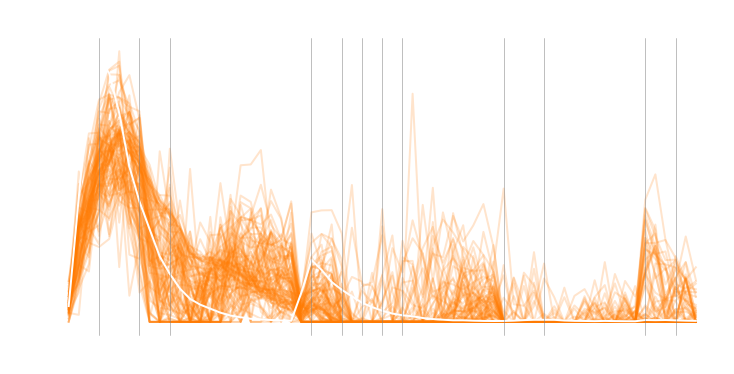

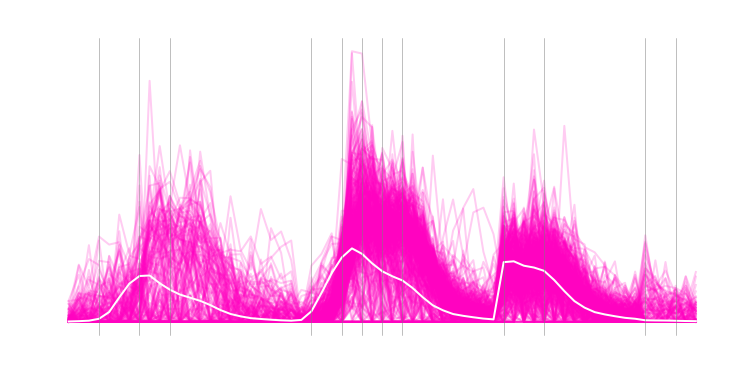

...

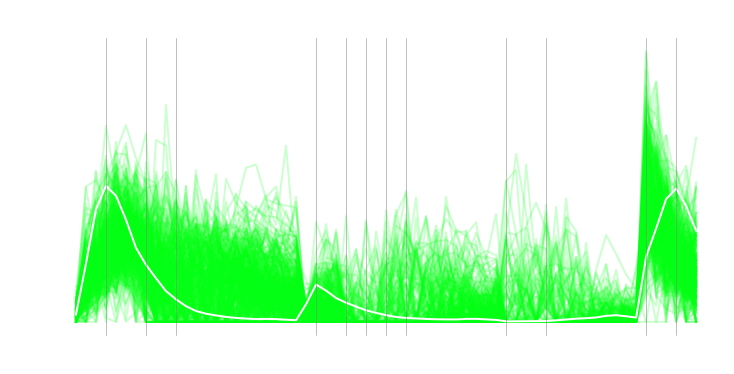

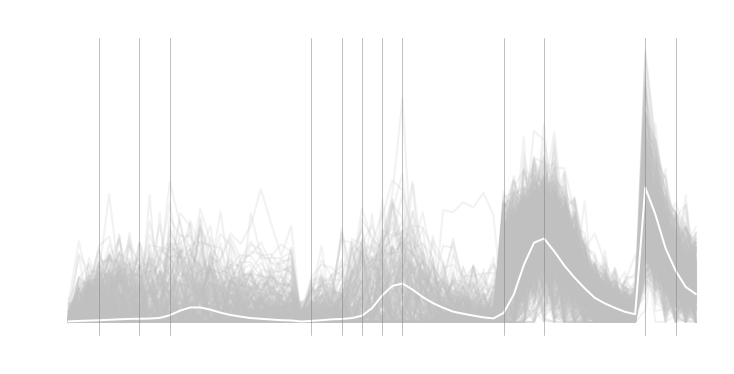

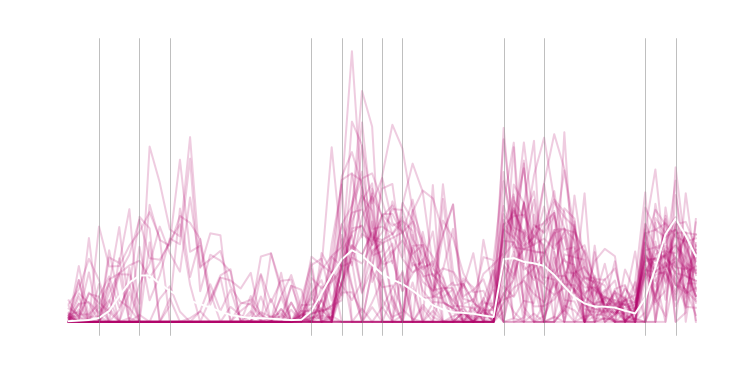

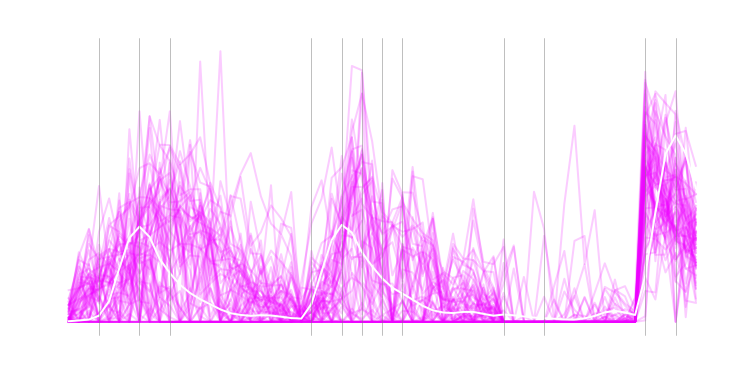

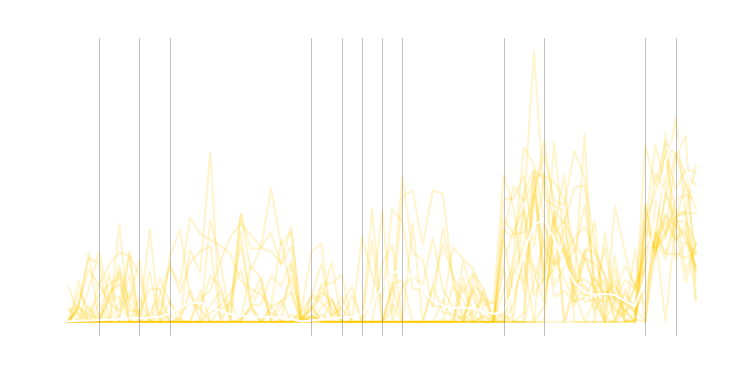

In [177]:
for c in np.unique(scinames_cosdist):
    # print('Cluster:', c)
    bool_c = scinames_cosdist == c
    spec_sub = spec_arr_bgsub_negzero_filt[bool_c,:]
    spec_sub_sumnorm = spec_sub / np.sum(spec_sub, axis=1)[:,None]

    # spec_sub_meansub = spec_sub - specs_med
    # spec_sub_meansub[spec_sub_meansub < 0] = 0

    fig, ax = ip.general_plot(dims=spec_dims, col='w')
    color = dict_sciname_color[c]
    # fsi.plot_cell_spectra(ax, spec_sub, {'lw':2,'alpha':0.2,'color':'r'})
    fsi.plot_cell_spectra(ax, spec_sub_sumnorm, {'lw':2,'alpha':0.2,'color':color})

    rs_ind = np.where(np.array(sci_names) == c)[0][0]
    rs = ref_spec_med[rs_ind][None,:]
    rs = rs / np.sum(rs)
    fsi.plot_cell_spectra(ax, rs, {'lw':2,'alpha':1,'color':'w'})

    ylim = ax.get_ylim()

    for x in xs:
        ax.plot([x,x], ylim, color=(0.5,0.5,0.5), lw=0.5)
    
    bc = barcodes[rs_ind]
    ax.set_title(c + ': ' + str(bc), color='w')
    plt.show()
    plt.close()

## Plot classif on image

Get raw image

In [179]:
czi_fns = [
"../../../../Data/bmg224/2023/brc_imaging/2023_10_16_hsdm/2023_10_18_hsdm_slide_IVL_fov_01_2023_10_18__14_19_02.czi",
"../../../../Data/bmg224/2023/brc_imaging/2023_10_16_hsdm/2023_10_18_hsdm_slide_IVL_fov_01_2023_10_18__14_30_13.czi",
"../../../../Data/bmg224/2023/brc_imaging/2023_10_16_hsdm/2023_10_18_hsdm_slide_IVL_fov_01_2023_10_18__14_41_26.czi",
"../../../../Data/bmg224/2023/brc_imaging/2023_10_16_hsdm/2023_10_18_hsdm_slide_IVL_fov_01_2023_10_18__14_52_37.czi",
"../../../../Data/bmg224/2023/brc_imaging/2023_10_16_hsdm/2023_10_18_hsdm_slide_IVL_fov_01_2023_10_18__15_03_49.czi",
]
os.path.exists(czi_fns[0])

True

In [180]:
# Get number of tiles or scenes
M, mtype = fsi.get_ntiles(czi_fns[0])
# Get the resolutions
resolutions = [fsi.get_resolution(fn) for fn in czi_fns]
# Get the lasers
lasers = [fsi.get_laser(fn) for fn in czi_fns]
# remove 405 channel
czi_fns = [fn for fn, l in zip(czi_fns, lasers) if l != 405]
resolutions = [r for r, l in zip(resolutions, lasers) if l != 405]
lasers = [l for l in lasers if l != 405]
czi_fns = [x for _, x in sorted(zip(lasers, czi_fns))]
resolutions = [x for _, x in sorted(zip(lasers, resolutions))]
lasers = sorted(lasers)



 DIMSHAPE ->> {'X': (0, 2048), 'Y': (0, 2048), 'Z': (0, 1), 'C': (0, 23), 'T': (0, 1), 'M': (0, 16), 'V': (0, 1), 'B': (0, 1)} 



In [181]:
raws = [fsi.load_raw(fn, m, mtype) for fn in czi_fns]
raws = [fsi.reshape_aics_image(r) for r in raws]
# some images have different pixel resolution, correct that
raws = fsi.match_resolutions_and_size(raws, resolutions)
image_max_norm = [fsi.max_norm(r) for r in raws]
sh = fsi._get_shift_vectors(image_max_norm)
raws_shift = fsi._shift_images(
    raws, sh, max_shift=500
)



In [ ]:
# Segment with no edge correction
stack = np.dstack(raws_shift)
stack_sum = np.sum(stack, axis=2)
pre = sf.pre_process(
    stack_sum, 
    gauss=config['gauss'], 
    diff_gauss=eval(config['diff_gauss'])
    )
mask = sf.get_background_mask(
    stack_sum,
    bg_smoothing=config['bg_smoothing'],
    n_clust_bg=config['n_clust_bg'],
    top_n_clust_bg=config['top_n_clust_bg'],
)
seg_new = sf.segment_02(pre, mask)





In [187]:
props_new = sf.measure_regionprops(seg_new, stack_sum)


In [200]:
# map new seg to old
centroids = props_filt.centroid.values
dict_nlab_color = {}
for i, c in enumerate(centroids):
    c = eval(c)
    c = [int(c_) for c_ in c]
    sciname = scinames_cosdist[i]
    color = dict_sciname_color[sciname]
    lnew = seg_new[c[0],c[1]]
    if lnew:
        dict_nlab_color[lnew] = color



In [213]:
# Adjust raw image
# stack_sum_norm = fsi.max_norm(stack, type='sum')
stack_sum_norm = (stack_sum - np.min(stack_sum)) / (np.max(stack_sum) - np.min(stack_sum))
clips = (0,1)
stack_sum_norm = np.clip(stack_sum_norm, clips[0], clips[1])
stack_sum_norm = (stack_sum_norm - clips[0])/(clips[1] - clips[0])


In [214]:
# Plot classif
dict_lab_bbox = dict(zip(props_new.label.values,props_new.bbox.values))
dict_nlab_bbox = {l: dict_lab_bbox[l] for l in dict_nlab_color.keys()}
seg_classif = sf.seg_2_rgb_dict(
    seg_new, 
    dict_nlab_color, 
    dict_nlab_bbox, 
    raw=stack_sum_norm
)



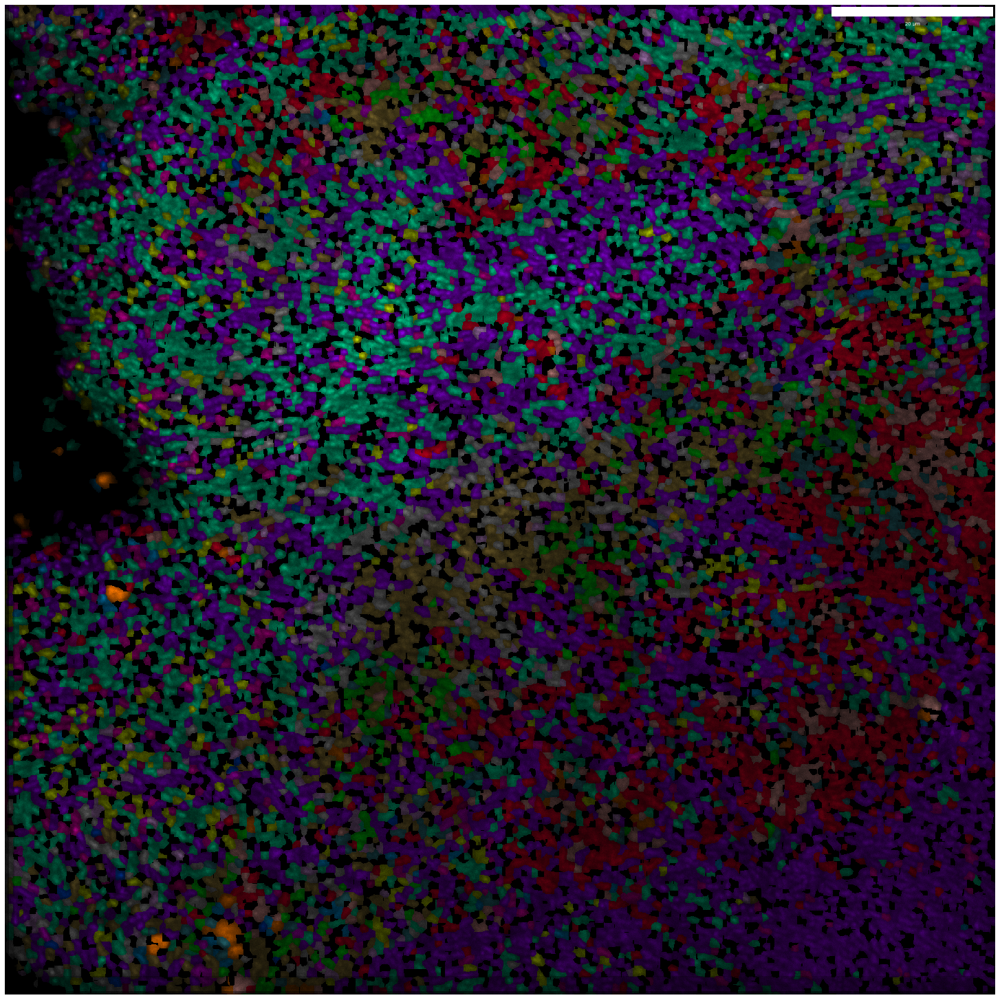

In [215]:
# Save plot
res_umpix = resolutions[0] * 1e6

fig, ax, cbar = ip.plot_image(
    seg_classif, 
    im_inches=20, 
    scalebar_resolution=res_umpix,
    cb_col=config['cb_col'],
    ft=config['im_ft']
)

In [219]:
a = pd.DataFrame({'a':[1,2,3],'b':[4,5,6]})
b = pd.DataFrame([])

In [221]:
b = b.append(a)

In [222]:
b

,a,b
0,1,4
1,2,5
2,3,6
